In [2]:
%load_ext autoreload
%autoreload 2

from clustering_comparison import *

### Clustering Comparisons for Spectral Imaging Data

Using many different clustering methods for comparing the differentiation between pmma and other plastics as well as materials such as glass and steel. This has application in Non Destructive Testing as well as in medical imaging. Images were aquired at 120 kVp with a spectral imaging detector. Clusters were evaluated using a manually created mask for each element. The variable used was the vscore since it is includes both homogeneity and completeness, both of which I would like to take into account.

In [ ]:
vs1 = plot_results(1,1,0,save=True,title='pc_all')

This first plotting function shows the results of using pca to reduce the 5 energy bins into two pc's for visualization. Runtime of the algorithm is shown on the bottom right and vscore on the top right. The scatter plot background is scales to the vscore. I will use this method as the benchmark. Below are the vscores plotted for the indevidual algorithms and materials.

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


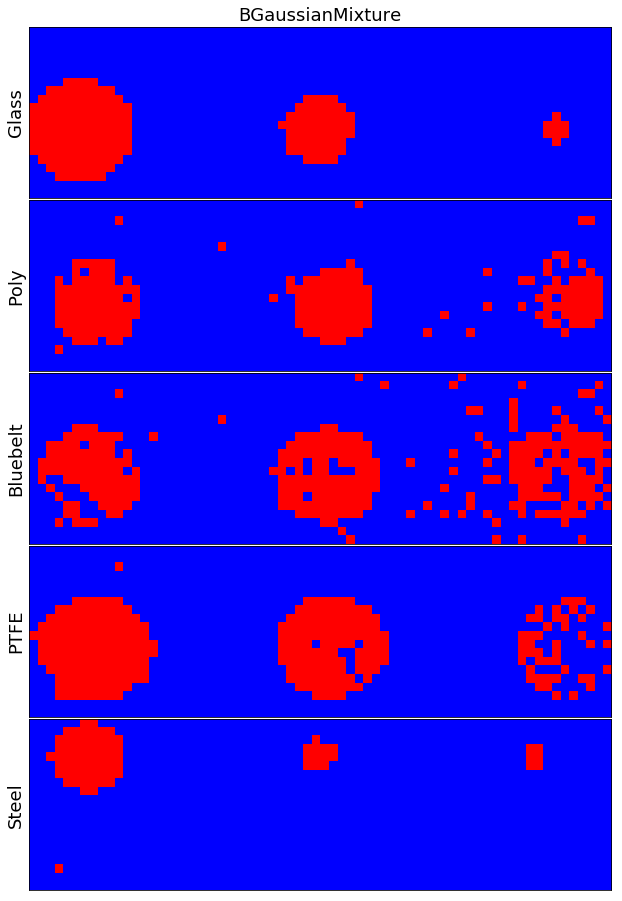

In [188]:
vs1 = plot_results(0,1,0,mode='se',title='se_gmm',cinds=[10])

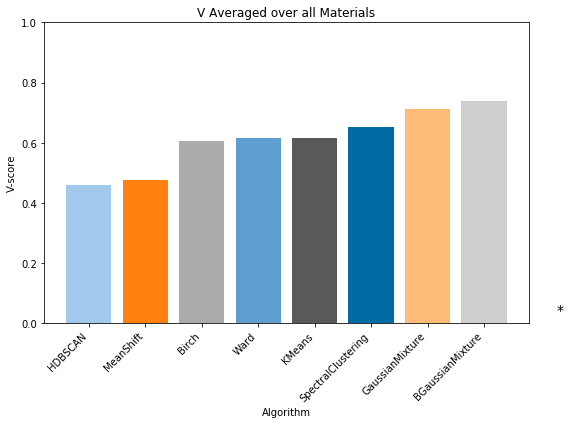

In [118]:
bars_pc = plot_results(0,0,0,1,return_vs=0,return_bars=1)

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 160 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 182 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 172 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
 

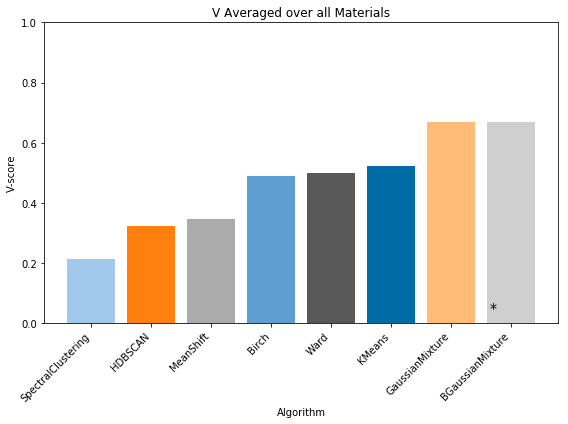

In [119]:
bars_se = plot_results(0,0,0,1,mode='se',return_vs=0,return_bars=1)

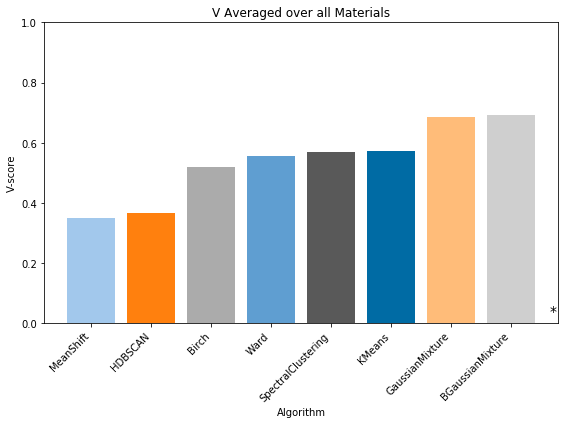

In [120]:
bars_de = plot_results(0,0,0,1,mode='de',return_vs=0,return_bars=1)

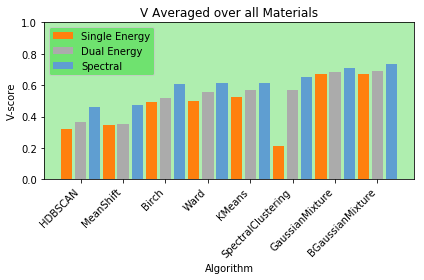

In [177]:
from clustering_comparison import *
compare_3(bars_se,bars_de,bars_pc,title='all')

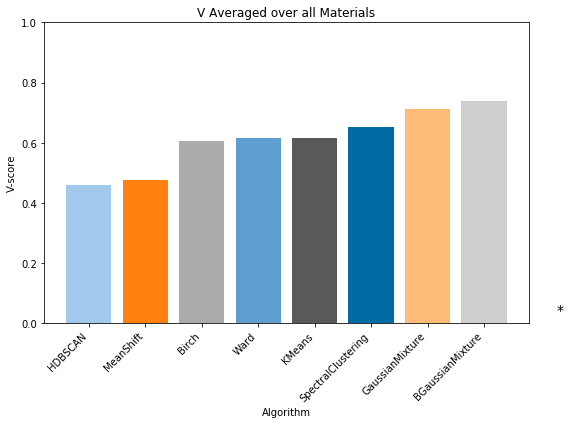

In [5]:
bars_pcs = plot_results(0,0,0,1,return_bars=1)

C:\ProgramData\Miniconda3\lib\site-packages\sklearn\mixture\base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


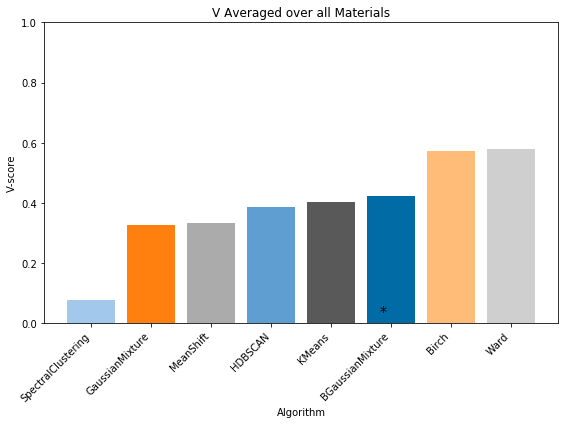

In [6]:
bars_ica = plot_results(0,0,0,1,red='ica',return_vs=0,return_bars=1)

In [9]:
bars_nmf = plot_results(0,0,0,1,red='nmf',scale=True,w_positions=True,return_bars=1)

ValueError: Negative values in data passed to NMF (input X)

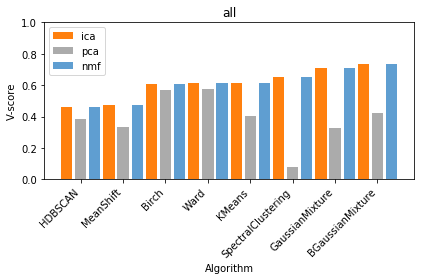

In [11]:
compare_3(bars_pcs,bars_ica,bars_pcs,leg=['ica','pca','nmf'],title=)

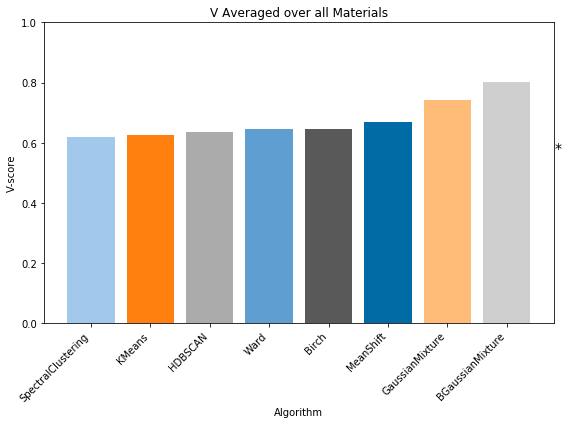

In [165]:
bars_pch = plot_results(0,0,0,1,return_vs=0,return_bars=1,dinds=[0,4])

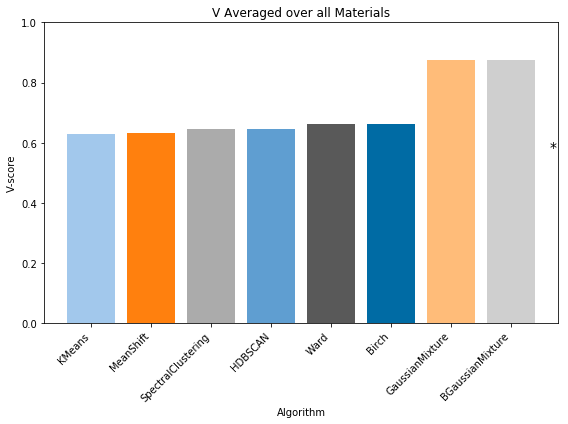

In [169]:
bars_deh = plot_results(0,0,0,1,mode='de',return_vs=0,return_bars=1,dinds=[0,4])

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 160 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 183 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


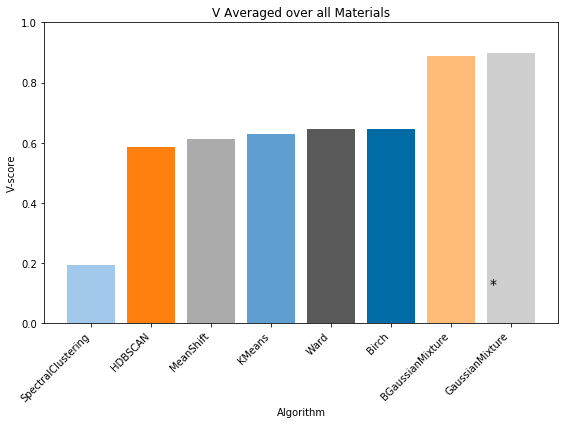

In [170]:
bars_seh = plot_results(0,0,0,1,mode='se',return_vs=0,return_bars=1,dinds=[0,4])

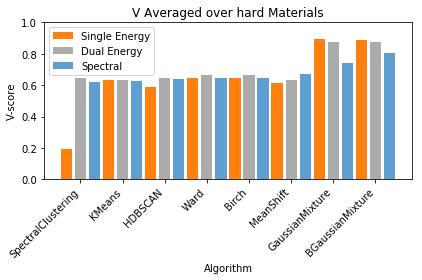

In [173]:
compare_3(bars_seh,bars_deh,bars_pch,title='hard')

As you can see the V score is best for the Gaussian Mixture (GM) and the KMeans (KM). However some of the algorithms are badly tuned right now so we shall try to improve that.

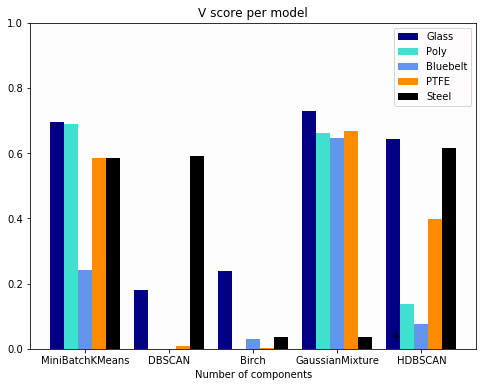

In [6]:
plot_results(0,0,1,scale=True)

Now I have scaled the inputs with sklearn standard scaler. One can see that birch and DBSCAN are sensitive to this parameter. However since the data is PC's the scaling is already a relevant input so this should not further improve the GM and KM.

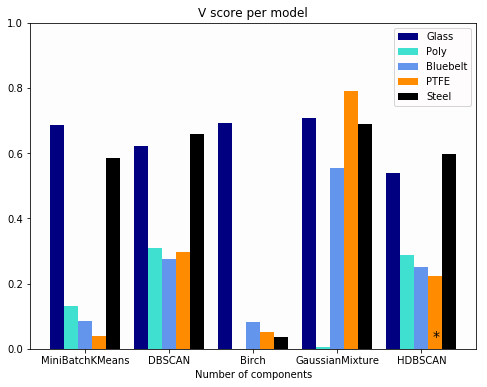

In [9]:
plot_results(0,0,1,scale=True,w_positions=True)

If we include the position data with the PCs some DBSCAN and Birch start to perk up but the GM still seems to be the leader using no position or scaling. Now you may be thinking that these plots looks suspiciously random, so lets try with a different random number seed:

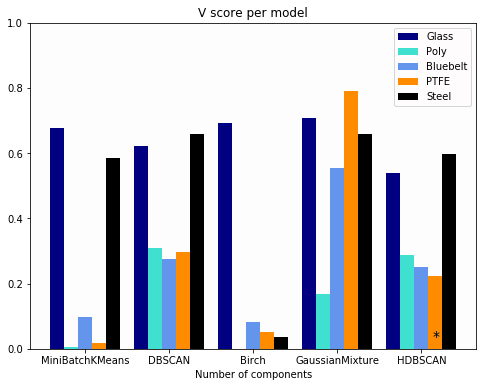

In [10]:
plot_results(0,0,1,scale=True,w_positions=True,rng=100)

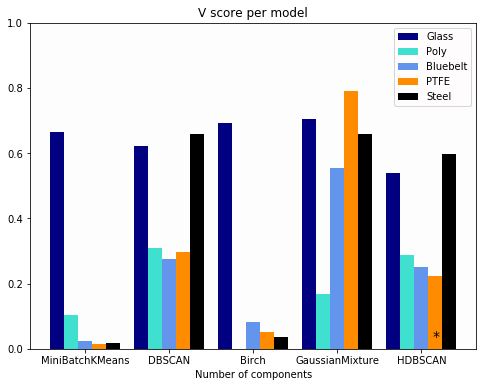

In [11]:
plot_results(0,0,1,scale=True,w_positions=True,rng=200)

We see that there is variance however the general pattern is remaining the same (he says waving his hands because he doesn't want to do the stdev).

Now what is important to spectral imaging is that the results are better than other imaging modalities such as single energy imaging (much much cheaper) and dual energy (much cheaper):

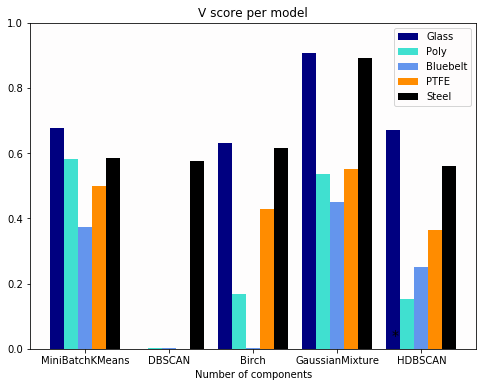

In [14]:
plot_results(0,0,1,mode='se',scale=True)

Bad news, glass and steel seem to reach the highest values when using single energy projection, however the plastics still have hope for spectral imaging. This is likely expected since the signal for these materials comes mostly from the density differences between PMMA (background) and glass/steel. Whereas for plastics the composition becomes important which can be determined by dual energy or spectral imaging. Lets try the same with positions now.

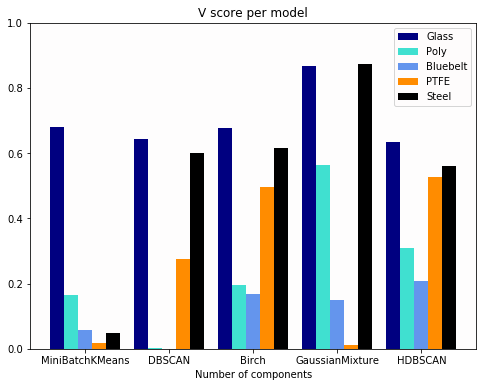

In [15]:
plot_results(0,0,1,mode='se',scale=True,w_positions=True)

Interestingly the plastics don't improve with position data. We will look into this with the dual energy case:

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceW

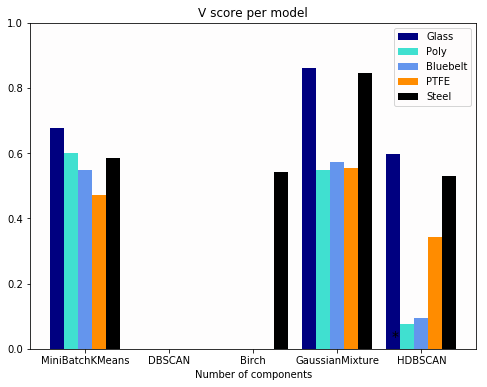

In [18]:
plot_results(0,0,1,mode='de')

Pretty good but still not the best on the plastics. Now lets have a look inside the clusters between adding the position data and not.

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/birch.py:629: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceW

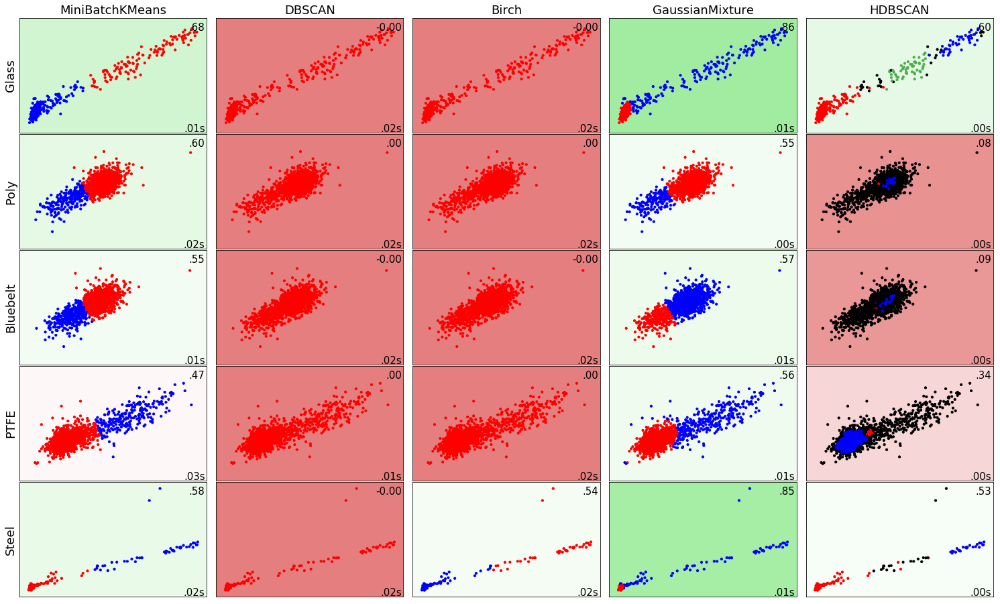

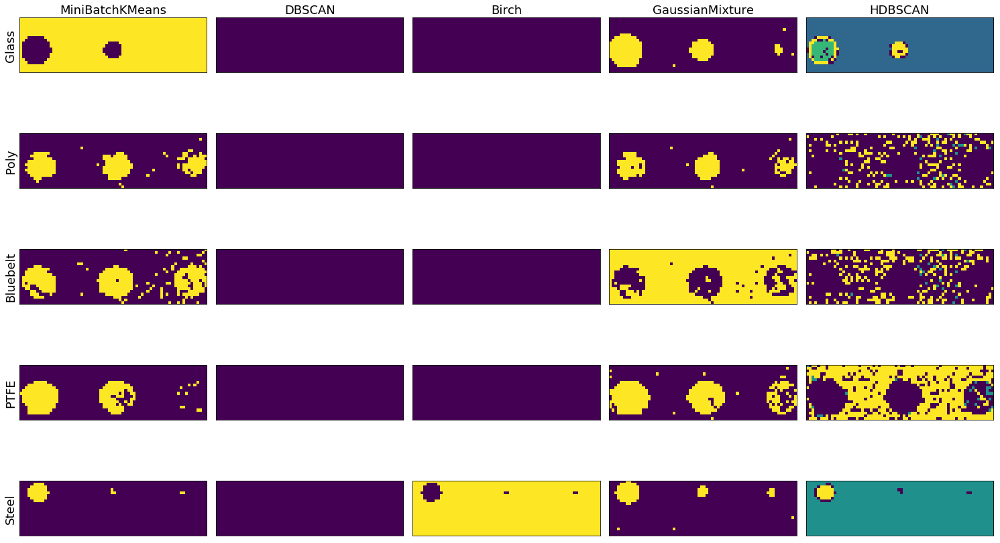

In [19]:
plot_results(1,1,0,mode='de')

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


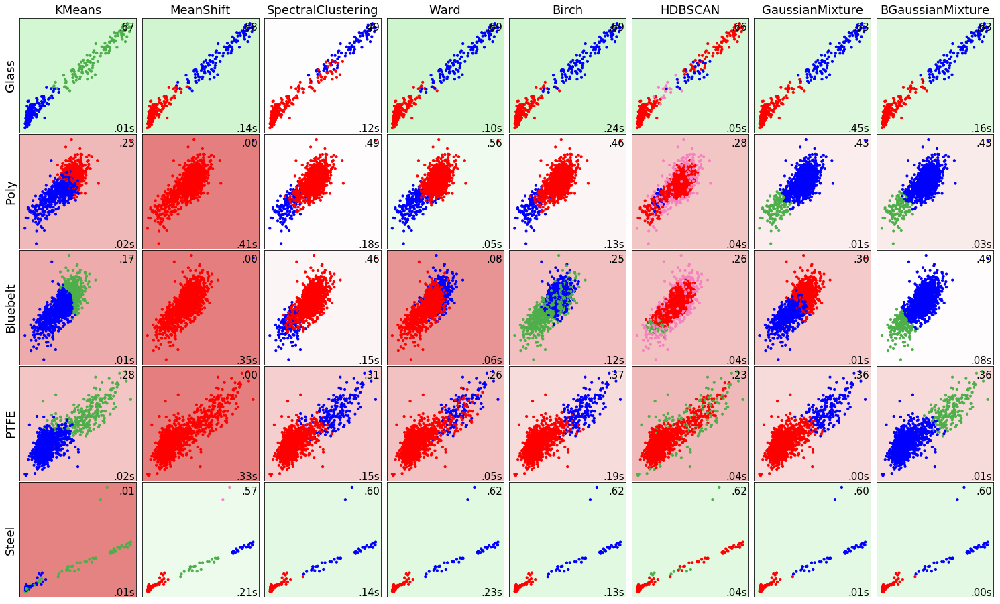

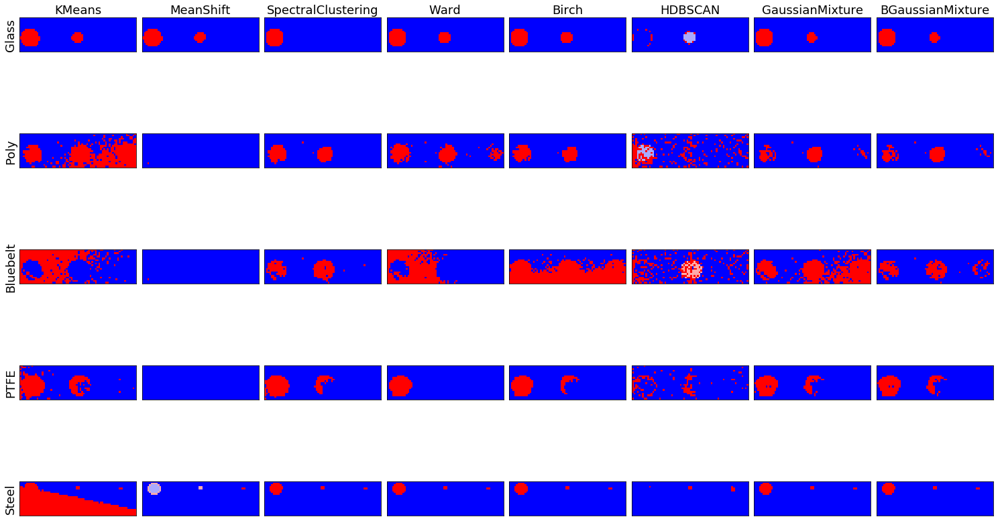

In [208]:
plot_results(1,1,0,mode='de',w_positions=True,scale=True)

Looking at this output I beleive that the algoritms get distracted by the background on the plastic images when you add in the positions. Whereas with the hard materials a global threshold, equivalent to a plane in the clustering hyperspace is sufficient to seperate the different materials however attempting to seperate the materials in the plastics with a global threshold results in what is happening in birch for bluebelt.

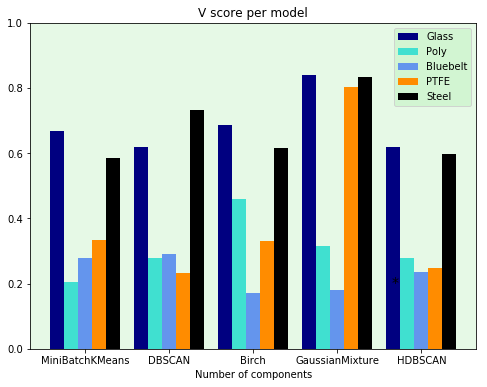

In [24]:
plot_results(0,0,1,mode='de',w_positions=True,scale=True)

Now lets try to make the paremeters a little better.

For n_clusters = 2 The average silhouette_score is : 0.920054442247
For n_clusters = 3 The average silhouette_score is : 0.90648329414
For n_clusters = 4 The average silhouette_score is : 0.877500548042
For n_clusters = 5 The average silhouette_score is : 0.862860487324
For n_clusters = 6 The average silhouette_score is : 0.862062469658


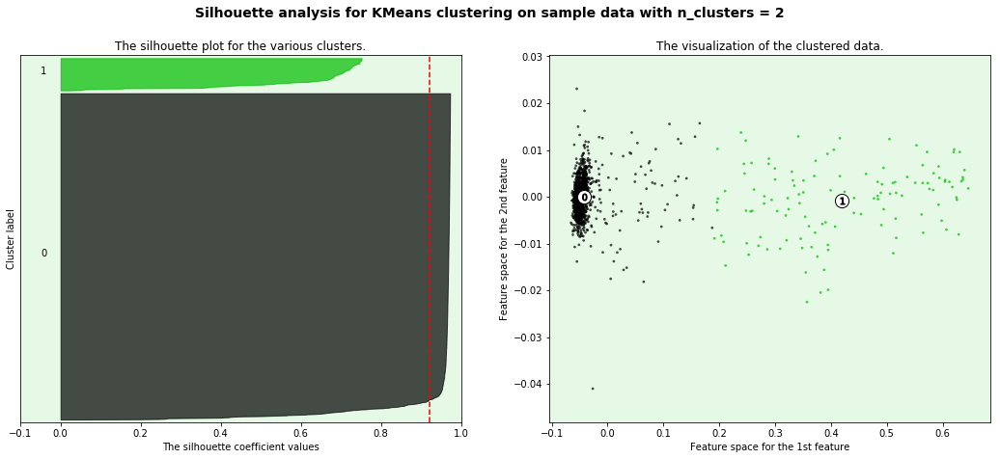

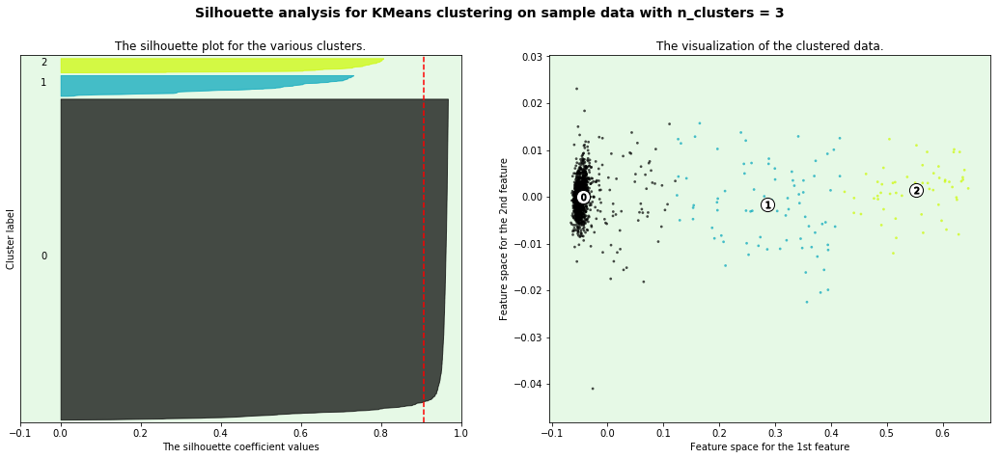

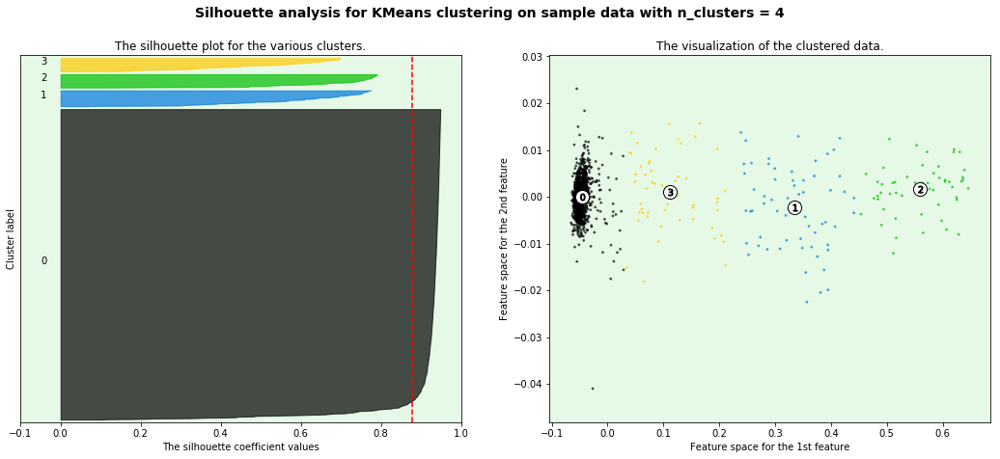

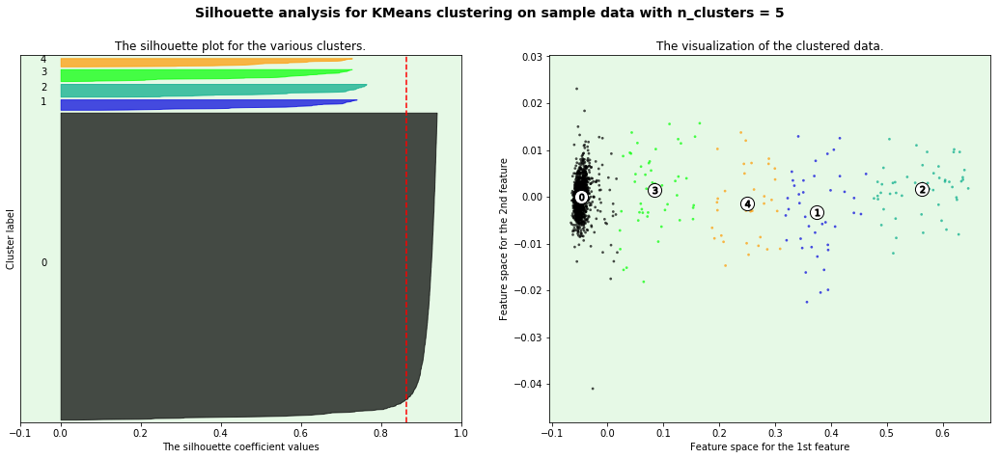

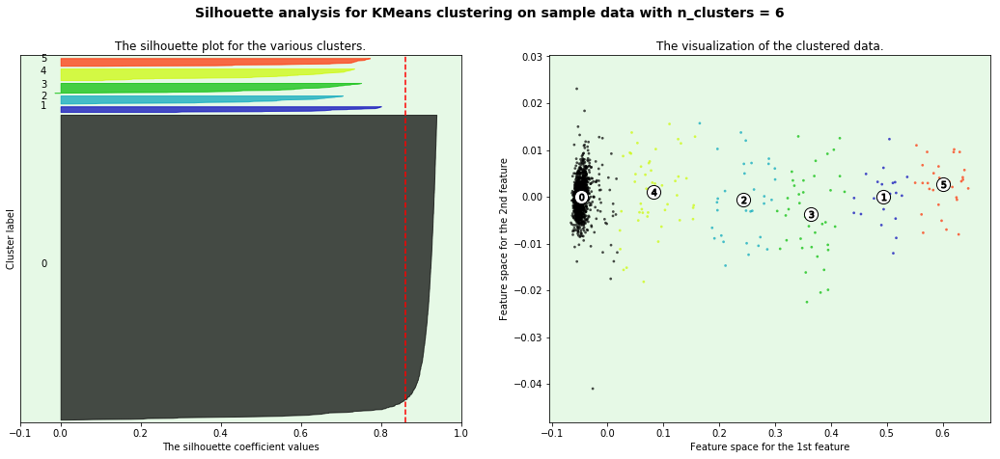

In [30]:
silhouette_analysis('glass')

For n_clusters = 2 The average silhouette_score is : 0.643527603927
For n_clusters = 3 The average silhouette_score is : 0.443545815133
For n_clusters = 4 The average silhouette_score is : 0.433738925692
For n_clusters = 5 The average silhouette_score is : 0.376703797225
For n_clusters = 6 The average silhouette_score is : 0.341394717231


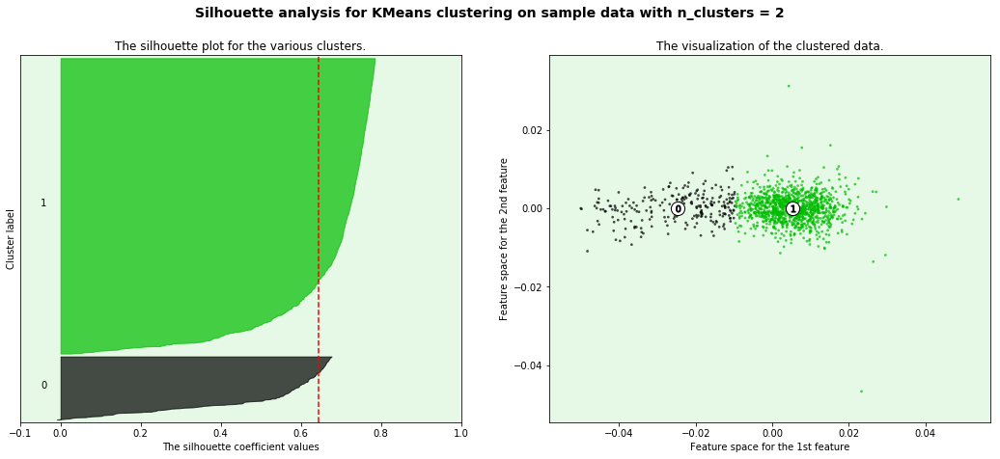

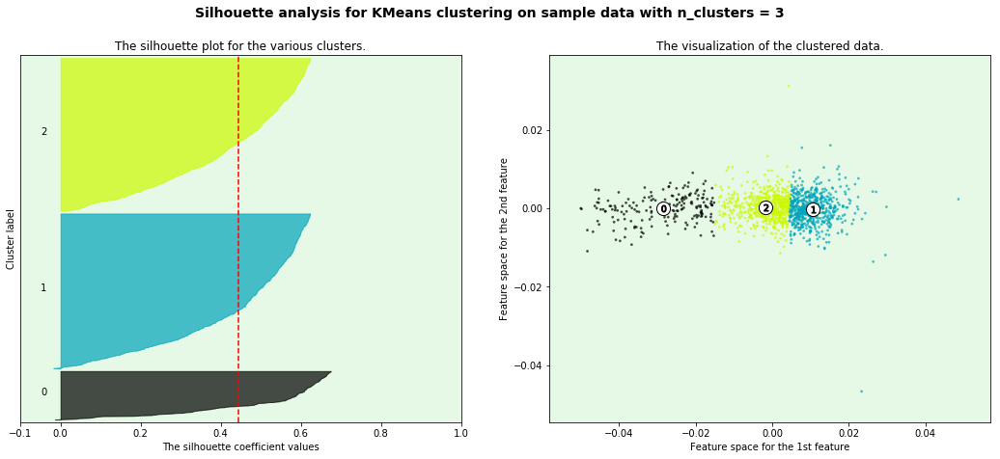

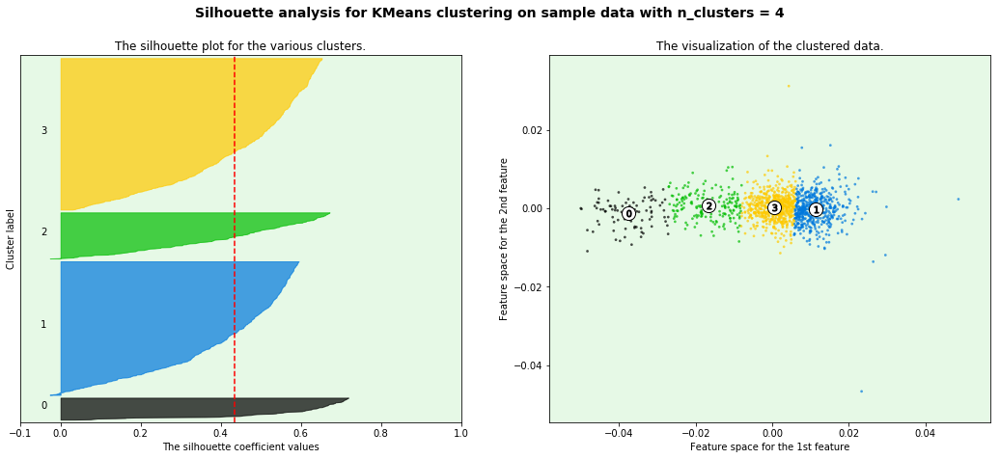

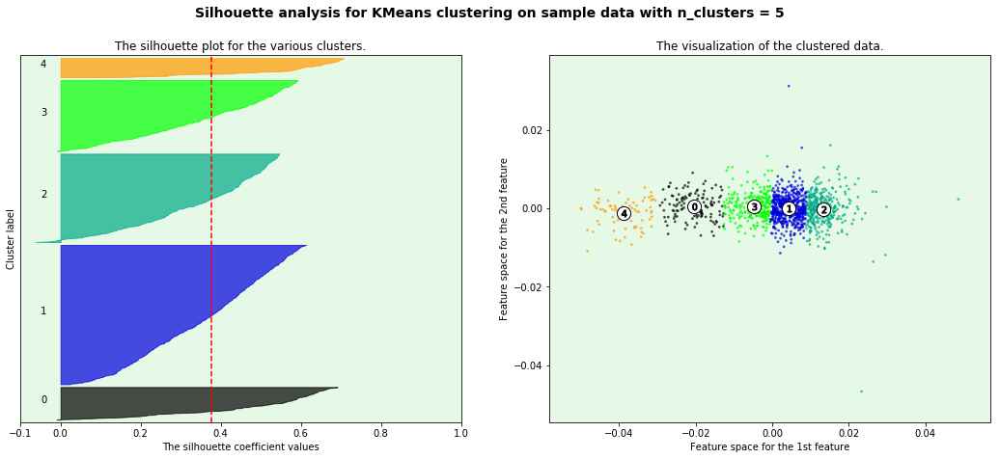

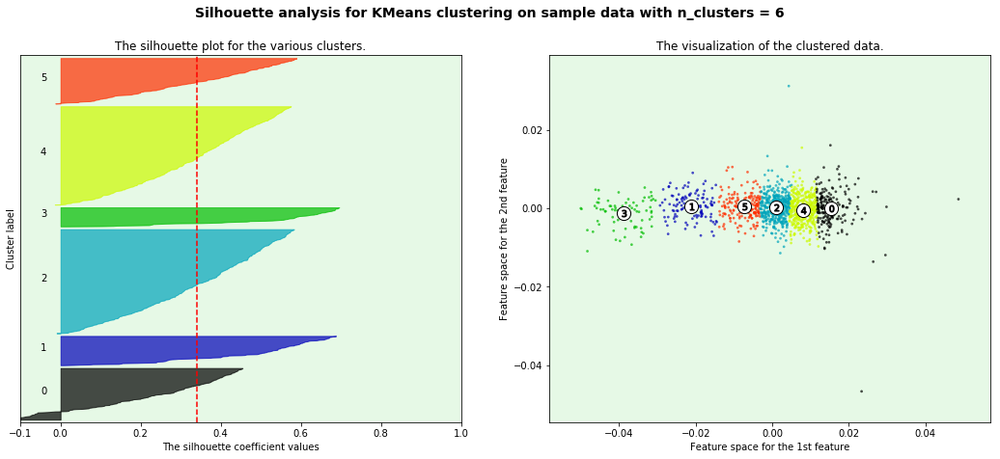

In [31]:
silhouette_analysis('pp')

Same for poly

In [35]:
silhouette_analysis('bb',plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.558489047221
For n_clusters = 3 The average silhouette_score is : 0.461677202478
For n_clusters = 4 The average silhouette_score is : 0.396738411651
For n_clusters = 5 The average silhouette_score is : 0.362898821402
For n_clusters = 6 The average silhouette_score is : 0.338335706546


And for bb

In [36]:
silhouette_analysis('ptfe',plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.724996642564
For n_clusters = 3 The average silhouette_score is : 0.618543915601
For n_clusters = 4 The average silhouette_score is : 0.453628804409
For n_clusters = 5 The average silhouette_score is : 0.440554726751
For n_clusters = 6 The average silhouette_score is : 0.434026905751


Now lets try with the non pca data

In [38]:
silhouette_analysis('bb',w_positions=True,plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.554544985447
For n_clusters = 3 The average silhouette_score is : 0.46776759813
For n_clusters = 4 The average silhouette_score is : 0.402511892424
For n_clusters = 5 The average silhouette_score is : 0.348703005787
For n_clusters = 6 The average silhouette_score is : 0.353113546833


In [39]:
silhouette_analysis('bb',w_positions=True,scale=True,plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.242686579861
For n_clusters = 3 The average silhouette_score is : 0.243173535492
For n_clusters = 4 The average silhouette_score is : 0.280876539539
For n_clusters = 5 The average silhouette_score is : 0.283634035798
For n_clusters = 6 The average silhouette_score is : 0.274542812268


Now I have some actual images of bb in chicken so lets try it on those.

In [40]:
silhouette_analysis('chick_glass',w_positions=True,scale=True,plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.322002365179
For n_clusters = 3 The average silhouette_score is : 0.315939255873
For n_clusters = 4 The average silhouette_score is : 0.362263882224
For n_clusters = 5 The average silhouette_score is : 0.378052942793
For n_clusters = 6 The average silhouette_score is : 0.358068046458


In [45]:
silhouette_analysis('chick_glass',plotting=False)

For n_clusters = 2 The average silhouette_score is : 0.673599818975
For n_clusters = 3 The average silhouette_score is : 0.603219824122
For n_clusters = 4 The average silhouette_score is : 0.53589432553
For n_clusters = 5 The average silhouette_score is : 0.53134080664
For n_clusters = 6 The average silhouette_score is : 0.539259280346


This still doesn't say whether or not the data belongs in only one cluster which is important. Kmeans likes perfect blobs but does not behave well on non isotropic data which I have.

n_digits: 2, 	 n_samples 1360, 	 n_features 2
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.03s	3	0.605	0.754	0.672	0.782	0.605	0.909
random   	0.02s	3	0.605	0.754	0.672	0.782	0.605	0.926
PCA-based	0.00s	3	0.605	0.754	0.672	0.782	0.605	0.921
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


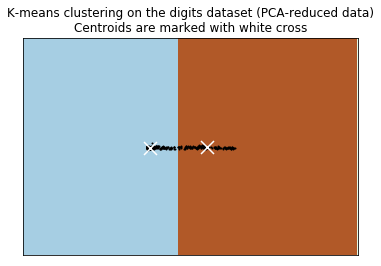

In [51]:
from clustering_comparison import *
kmeans_finetune('glass')

n_digits: 2, 	 n_samples 1360, 	 n_features 2
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.03s	0	0.635	0.607	0.620	0.757	0.607	0.560
random   	0.03s	0	0.632	0.604	0.618	0.755	0.604	0.548
PCA-based	0.02s	0	0.628	0.598	0.612	0.749	0.598	0.541
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


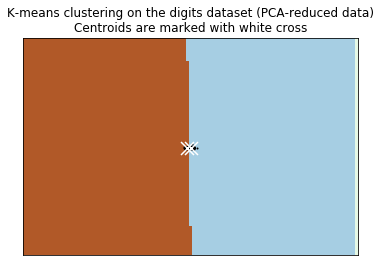

In [52]:
kmeans_finetune('bb')

In [54]:
kmeans_finetune('pp',plotting=False,w_positions=True,scale=True)

n_digits: 2, 	 n_samples 1360, 	 n_features 4
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.09s	4181	0.180	0.128	0.150	0.100	0.128	0.240
random   	0.04s	4181	0.180	0.128	0.150	0.100	0.128	0.248
PCA-based	0.01s	4245	0.021	0.015	0.017	0.008	0.014	0.235
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


In [55]:
kmeans_finetune('pp',plotting=False,w_positions=True,scale=True,mode='de')

n_digits: 2, 	 n_samples 1360, 	 n_features 4
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.05s	3866	0.316	0.234	0.268	0.293	0.233	0.277
random   	0.06s	3866	0.316	0.234	0.268	0.293	0.233	0.277
PCA-based	0.01s	3866	0.301	0.220	0.254	0.263	0.220	0.260
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


In [58]:
kmeans_finetune('pp',plotting=False,w_positions=True,scale=True,mode='all')

n_digits: 2, 	 n_samples 1360, 	 n_features 7
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.08s	5865	0.618	0.671	0.643	0.786	0.617	0.441
random   	0.04s	5865	0.618	0.671	0.643	0.786	0.617	0.448
PCA-based	0.00s	5865	0.618	0.671	0.643	0.786	0.617	0.447
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


n_digits: 2, 	 n_samples 1360, 	 n_features 2
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.03s	0	0.669	0.711	0.689	0.823	0.669	0.649
random   	0.05s	0	0.669	0.711	0.689	0.823	0.669	0.651
PCA-based	0.00s	0	0.669	0.711	0.689	0.823	0.669	0.641
__________________________________________________________________________________


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


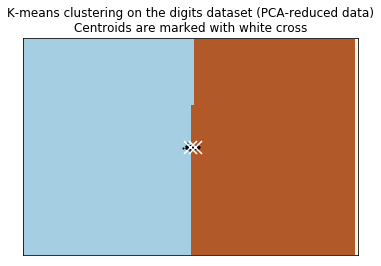

In [60]:
kmeans_finetune('pp')

Now lets try to optimize the indevidual parameters:

## KMeans

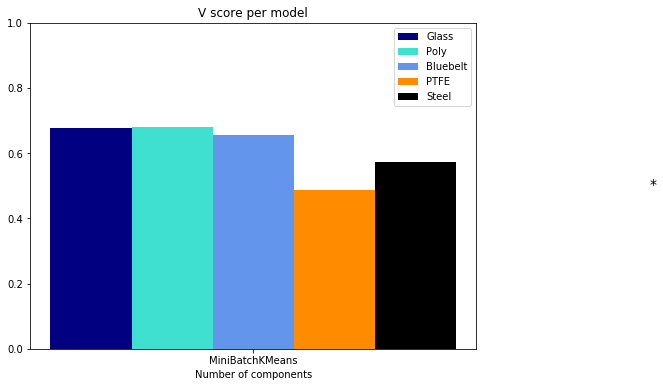

In [7]:
plot_results(cinds=[0]) # Not a lot of ways to improve

Can add some fuzz

## Fuzzy K-means

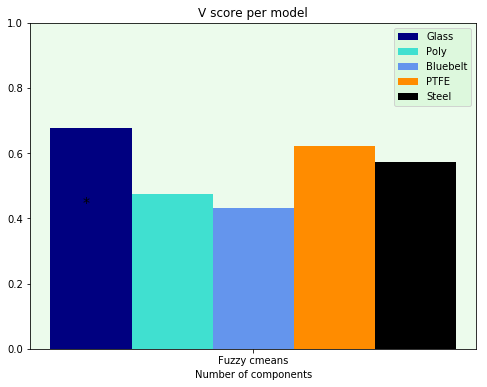

In [44]:
plot_fuzzy(0,0,1,m=50)

Not that different

## Affinity Propagation

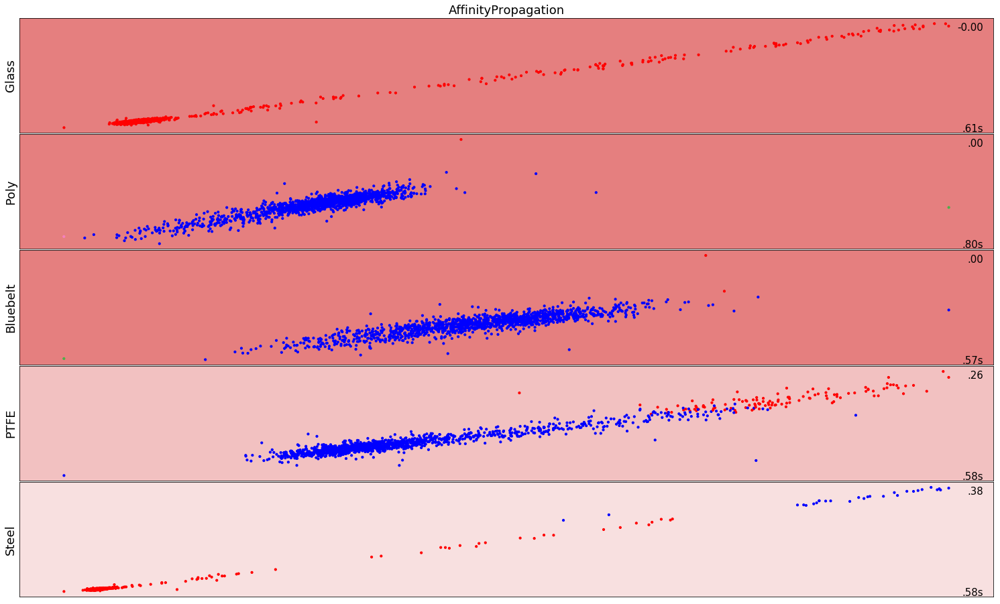

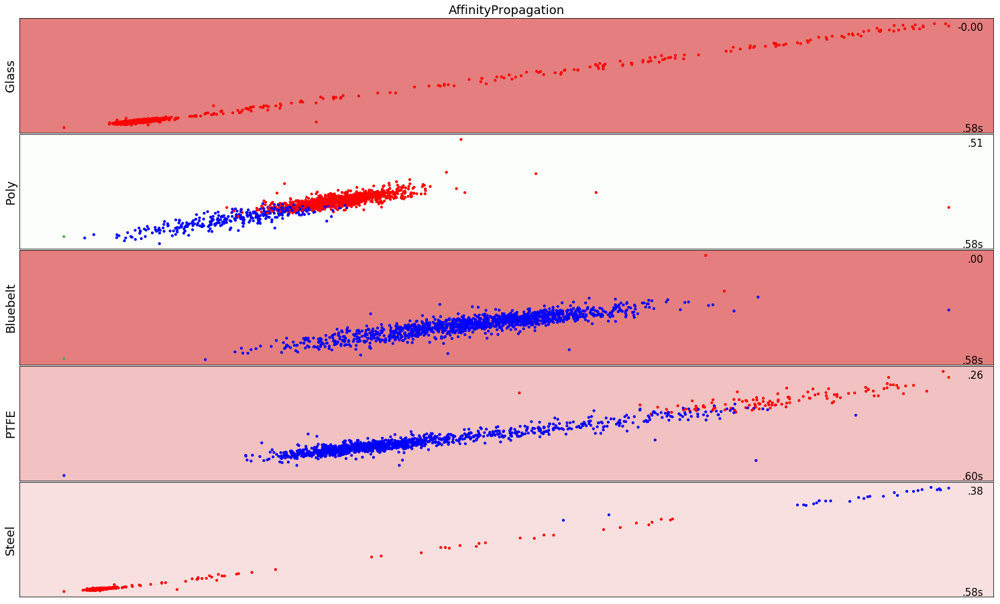

In [58]:
default_base = {'quantile': .3,
            'eps': .5,
            'damping': .9,
            'preference': -200,
            'n_neighbors': 2,
            'n_clusters': 2}

algo_params = {'linkage': 'average','preference': None,'damping':0.95}
algo_params2 = {'linkage': 'average','preference': None,'damping':0.999}

vs1 = plot_results(1,0,0,cinds=[1],mode='all',scale=True,w_positions=True,algo_params=algo_params) 
vs2 = plot_results(1,0,0,cinds=[1],mode='all',scale=True,w_positions=True,algo_params=algo_params2)

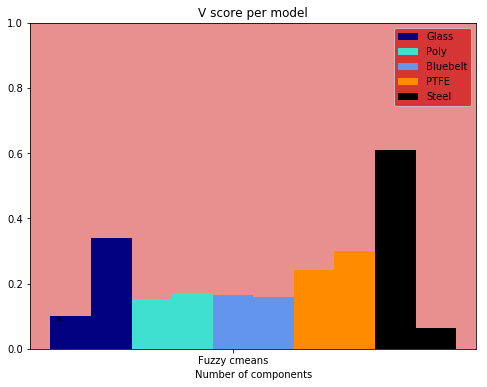

In [48]:
compare_outputs(vs1,vs2) # There is no difference

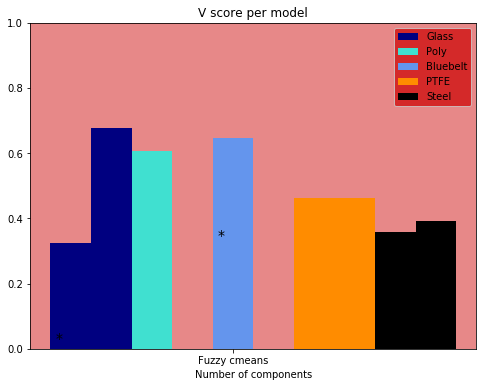

In [43]:
algo_params = {'linkage': 'complete'}

vs1 = plot_results(0,0,0,cinds=[4],algo_params=algo_params)
vs2 = plot_results(0,0,0,cinds=[5],algo_params=algo_params)

compare_outputs(vs1,vs2) # There is no difference

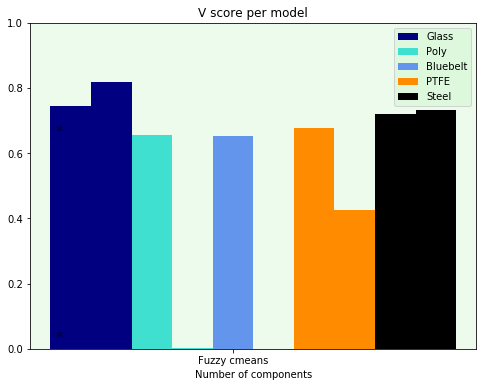

In [60]:
vs1 = plot_results(0,0,0,cinds=[8])
vs2 = plot_results(0,0,0,cinds=[8],mode='all',scale=True)

compare_outputs(vs1,vs2)

## Mean Shift

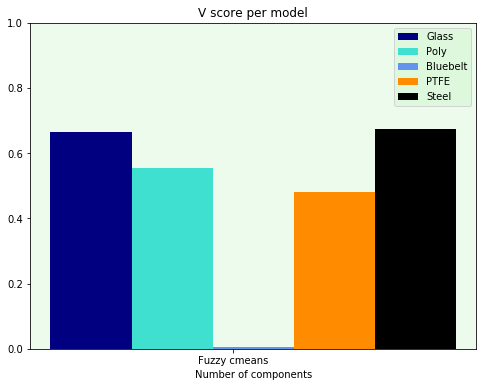

In [70]:
vs1 = plot_results(0,0,0,cinds=[2]) 
vs2 = plot_results(0,0,0,cinds=[2],rng=22)
# Mean shift does not vary
compare_outputs(vs1,vs2)

## Spectral

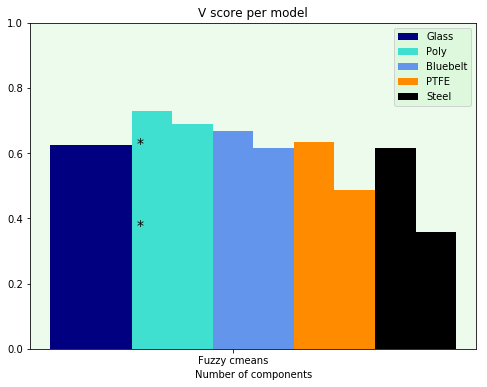

In [79]:
algo_params = {'affinity':'rbf'}

vs1 = plot_results(0,0,0,cinds=[3],rng=20) 
vs2 = plot_results(0,0,0,cinds=[3],rng=44,algo_params=algo_params)
# Mean shift does not vary
compare_outputs(vs1,vs2)

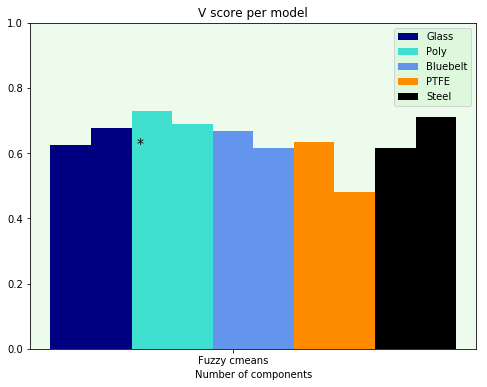

In [81]:
algo_params = {'affinity':'sigmoid'}

vs1 = plot_results(0,0,0,cinds=[3],rng=20) 
vs2 = plot_results(0,0,0,cinds=[3],rng=44,algo_params=algo_params)
# Mean shift does not vary
compare_outputs(vs1,vs2)

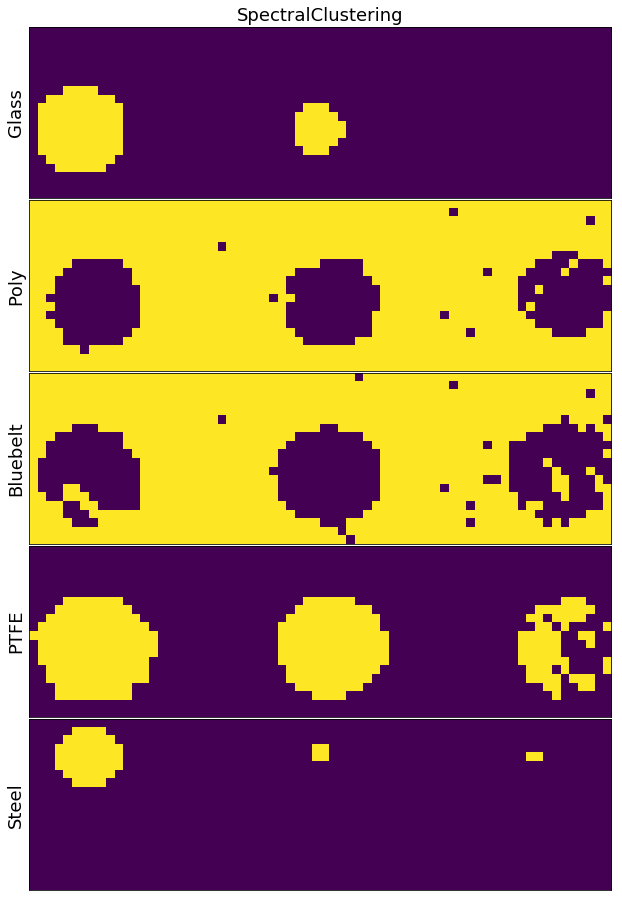

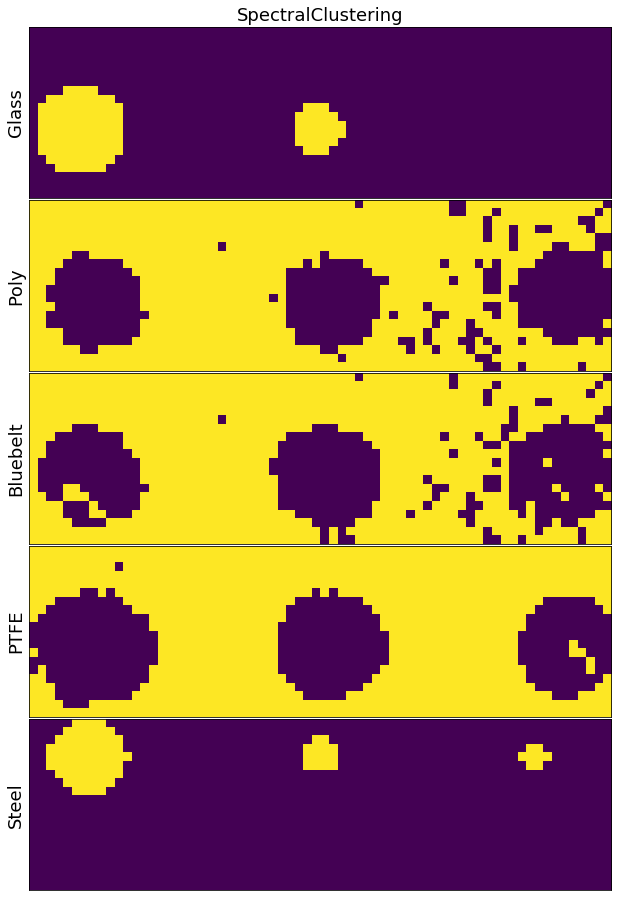

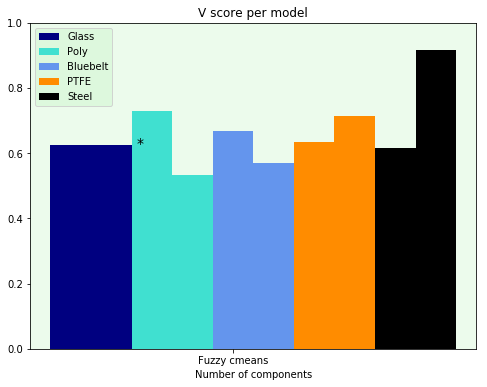

In [91]:
algo_params = {'assign_labels':'discretize'}

vs1 = plot_results(0,1,0,cinds=[3],rng=20) 
vs2 = plot_results(0,1,0,cinds=[3],rng=44,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

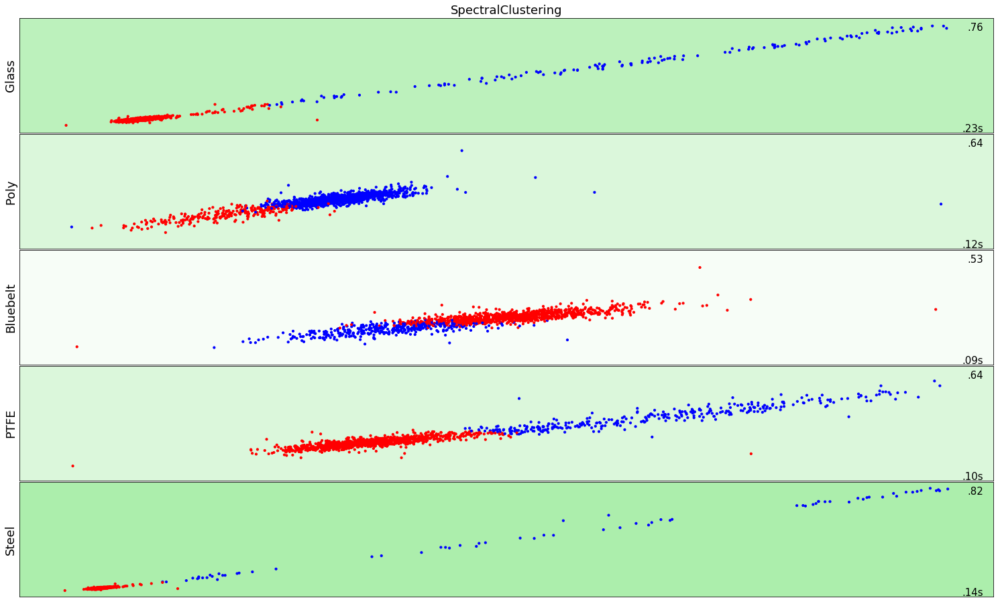

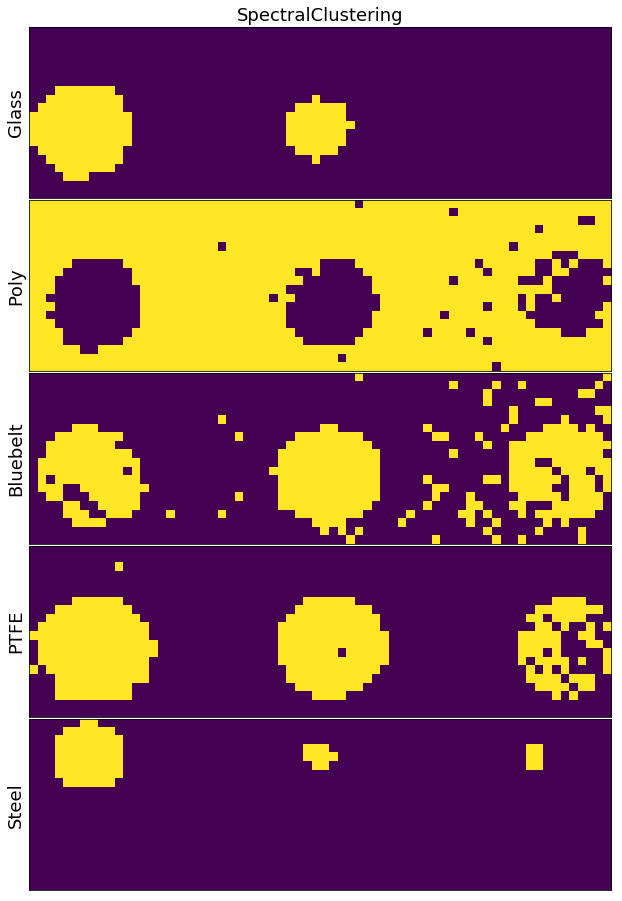

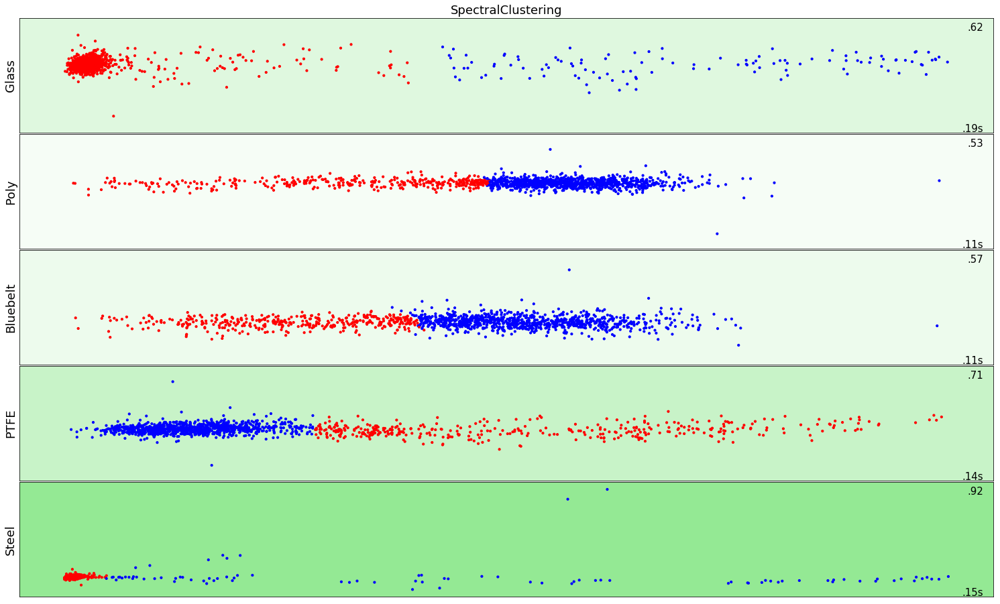

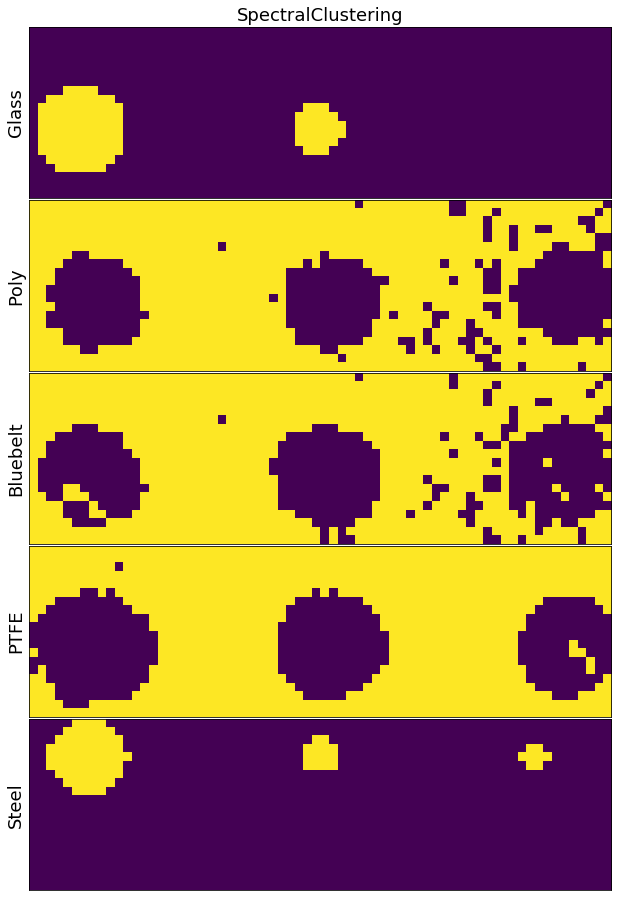

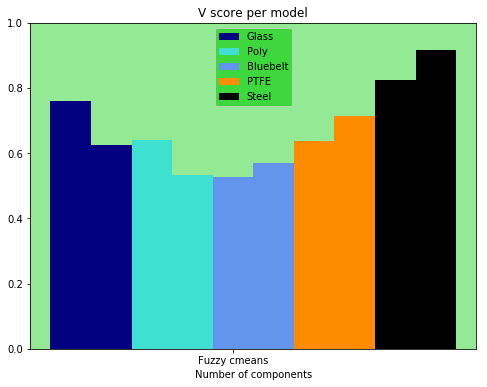

In [92]:
algo_params = {'assign_labels':'discretize'}

vs1 = plot_results(1,1,0,cinds=[3],rng=20,mode='all',algo_params=algo_params) 
vs2 = plot_results(1,1,0,cinds=[3],rng=44,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

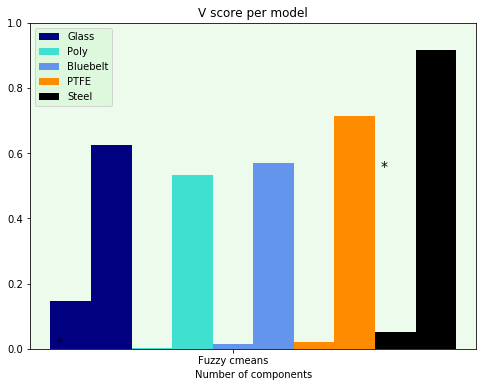

In [90]:
algo_params = {'assign_labels':'discretize'}

vs1 = plot_results(0,0,0,cinds=[3],rng=20,w_positions=True,scale=True,algo_params=algo_params) 
vs2 = plot_results(0,0,0,cinds=[3],rng=44,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

## DBSCAN

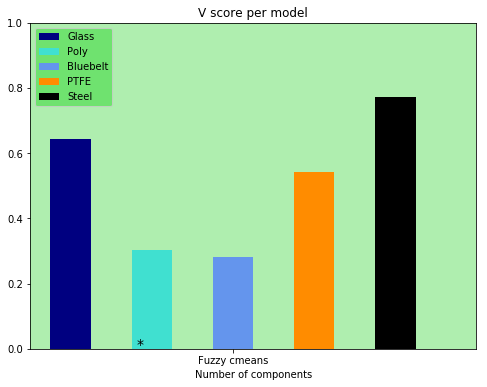

In [30]:
algo_params = {'min_samples':2}

vs1 = plot_results(0,0,0,cinds=[6],rng=20,w_positions=True,scale=True) 
vs2 = plot_results(0,0,0,cinds=[6],rng=44,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

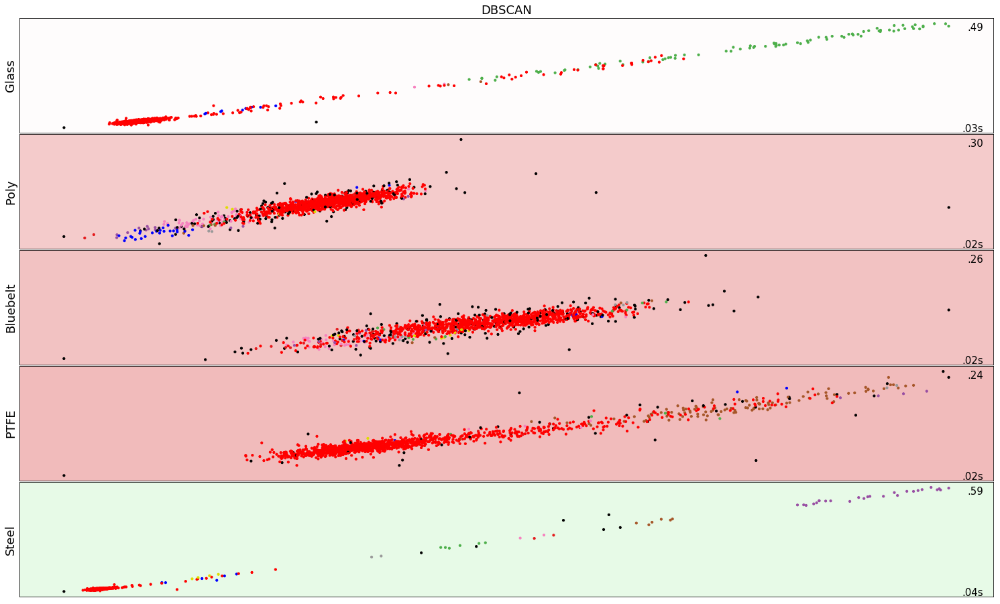

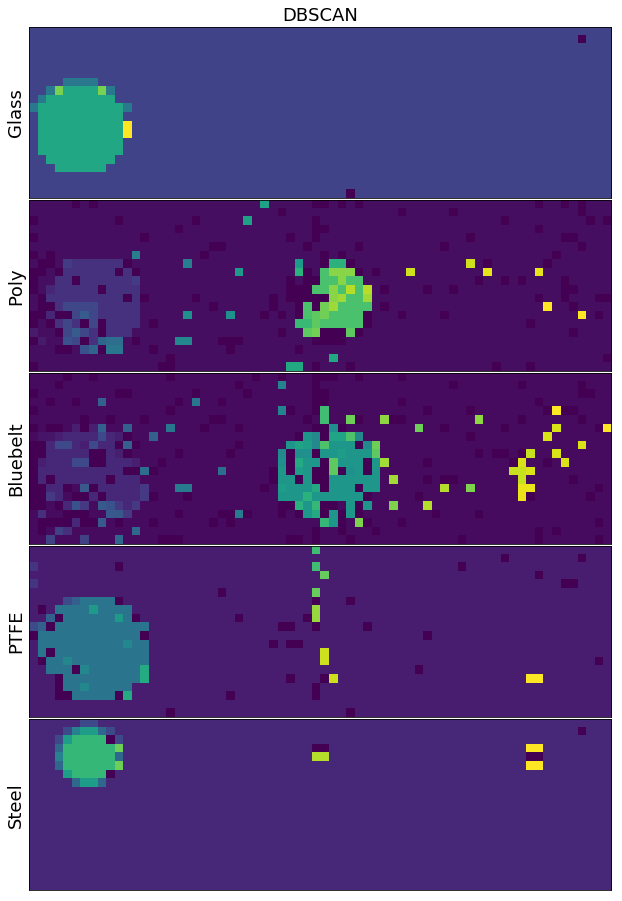

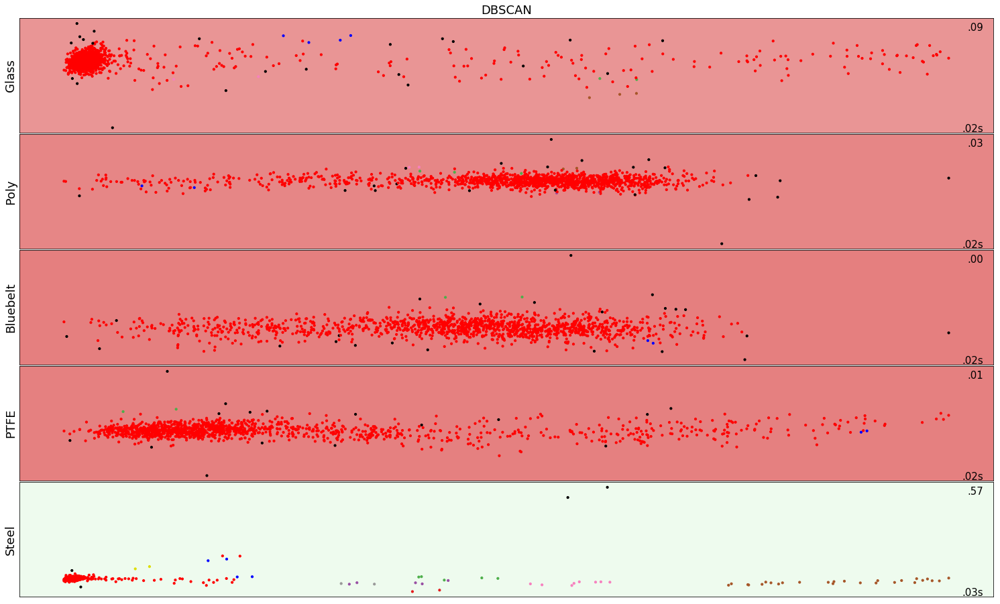

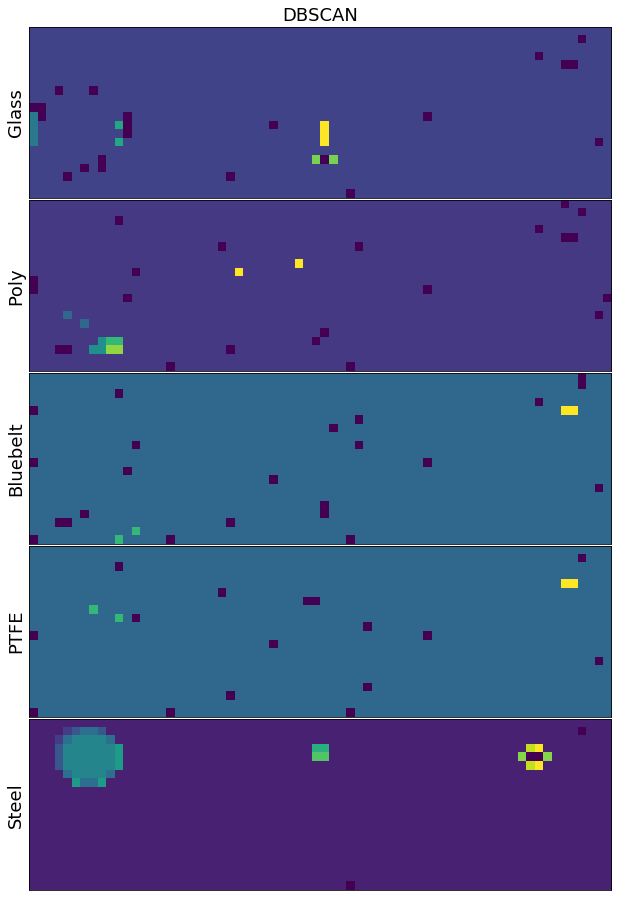

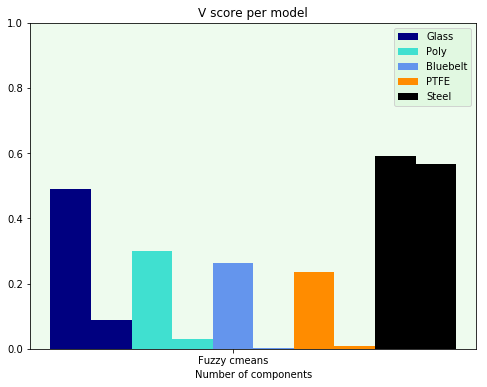

In [128]:
algo_params = {'min_samples':30,'eps':0.75}

vs1 = plot_results(1,1,0,cinds=[6],rng=20,mode='all',scale=True,w_positions=True,algo_params=algo_params) 
vs2 = plot_results(1,1,0,cinds=[6],rng=4,scale=True,w_positions=True,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

I'm asking an odd thing of the algorithms since I wan't them to group something that is not globular

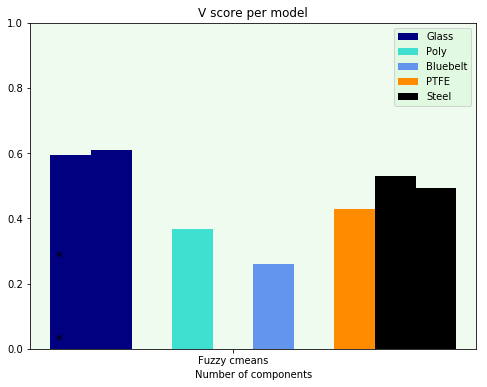

In [132]:
algo_params = {'min_samples':30,'eps':0.75}

vs1 = plot_results(0,0,0,cinds=[9],rng=20,mode='all',algo_params=algo_params) 
vs2 = plot_results(0,0,0,cinds=[9],rng=4,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

## HDBscan

Hard to know what the eps and min_sample are for a variety of different samples

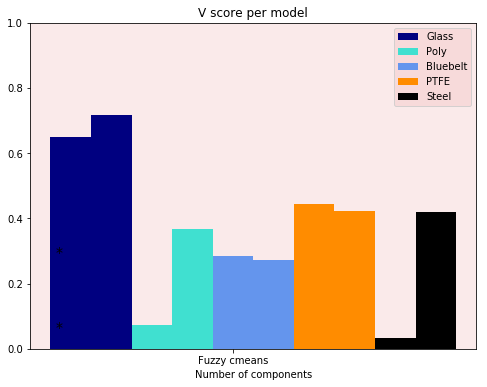

In [69]:
algo_params = {'min_samples': 10, 'eps': 0.3}
algo_params2 = {'min_samples': 15, 'eps': 0.9}

vs1 = plot_results(0, 0, 0, cinds=[8], rng=10)
vs2 = plot_results(0, 0, 0, cinds=[8], rng=4, algo_params=algo_params2)
# That is something
compare_outputs(vs1, vs2)

## GMM

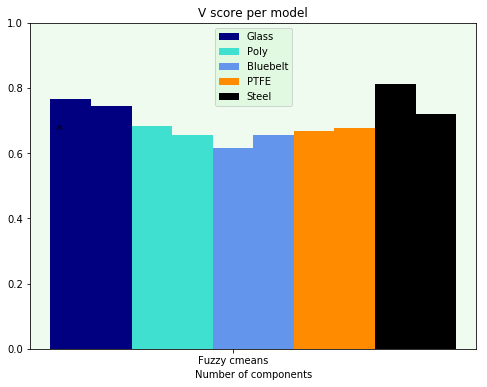

In [158]:
algo_params = {'min_samples': 30, 'eps': 0.75}
algo_params2 = {'min_samples': 28, 'eps': 0.75}

vs1 = plot_results(0, 0, 0, cinds=[10], rng=10, algo_params=algo_params)
vs2 = plot_results(0, 0, 0, cinds=[8], rng=4, algo_params=algo_params2)
# That is something
compare_outputs(vs1, vs2)

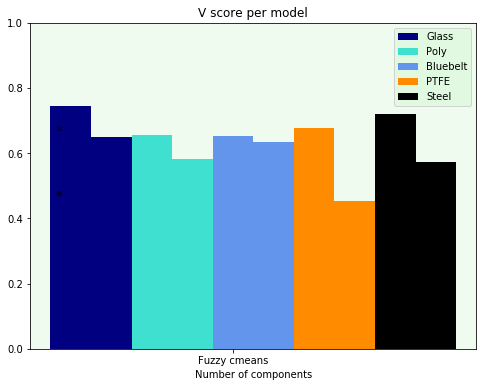

In [159]:
algo_params = {'ct': 'tied'}


vs1 = plot_results(0, 0, 0, cinds=[8], rng=10)
vs2 = plot_results(0, 0, 0, cinds=[8], rng=4, algo_params=algo_params)
# That is something
compare_outputs(vs1, vs2)

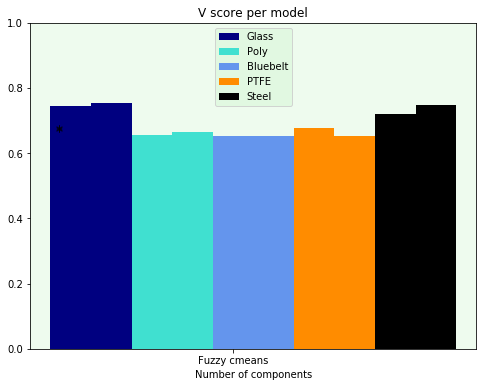

In [160]:
algo_params = {'ct':'diag'}


vs1 = plot_results(0,0,0,cinds=[8],rng=10) 
vs2 = plot_results(0,0,0,cinds=[8],rng=4,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

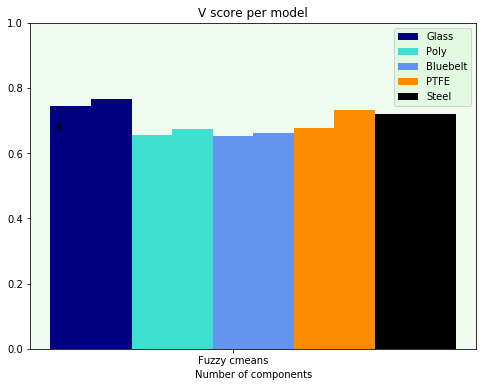

In [161]:
algo_params = {'ct':'spherical'}


vs1 = plot_results(0,0,0,cinds=[8],rng=10) 
vs2 = plot_results(0,0,0,cinds=[8],rng=4,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

## BGMM

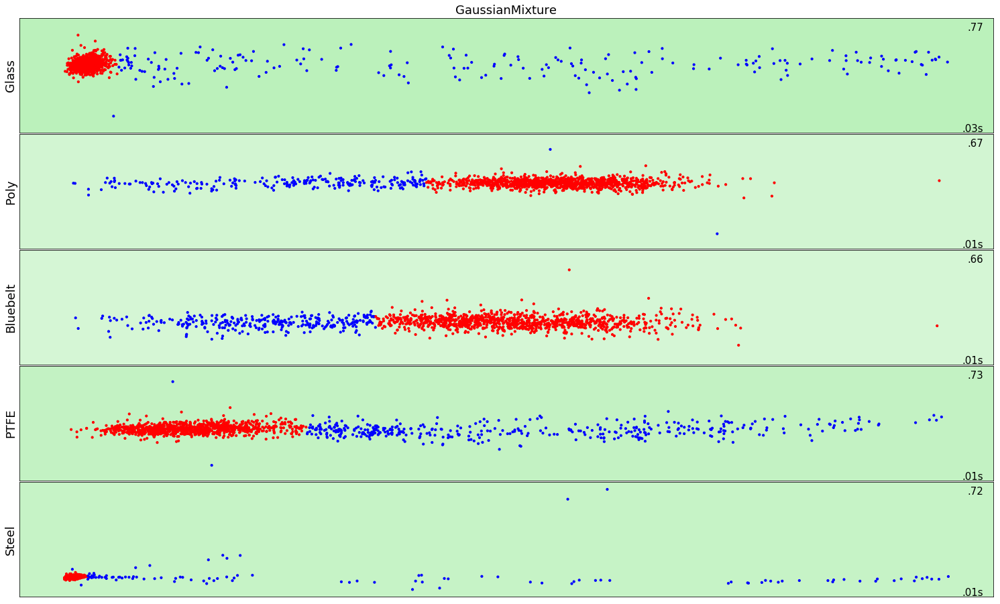

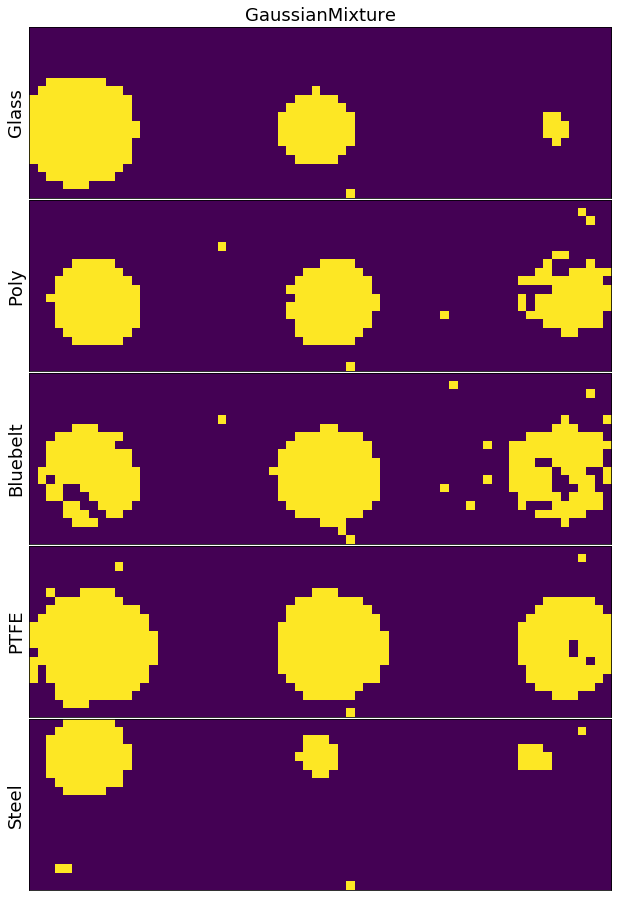

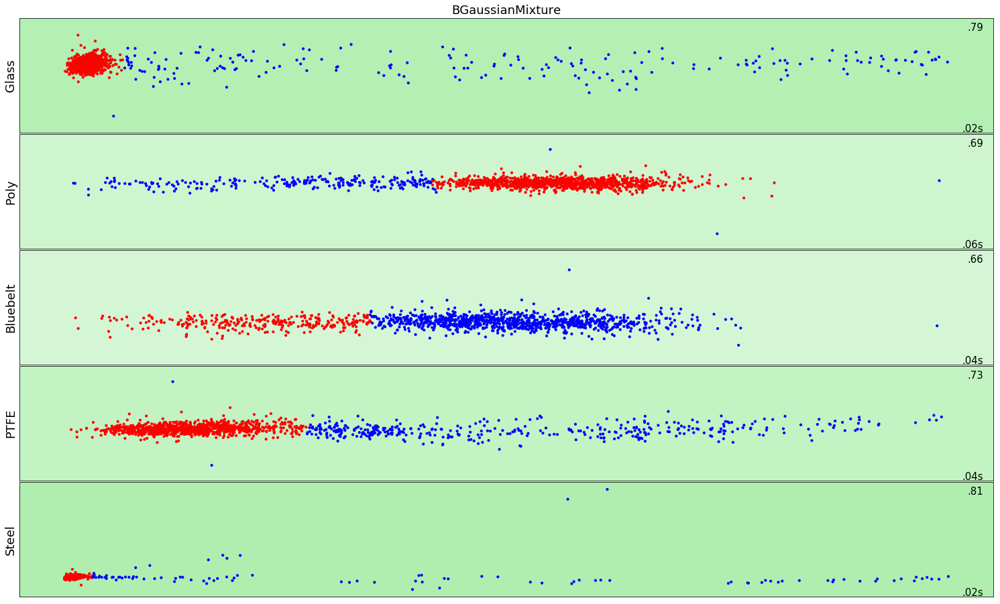

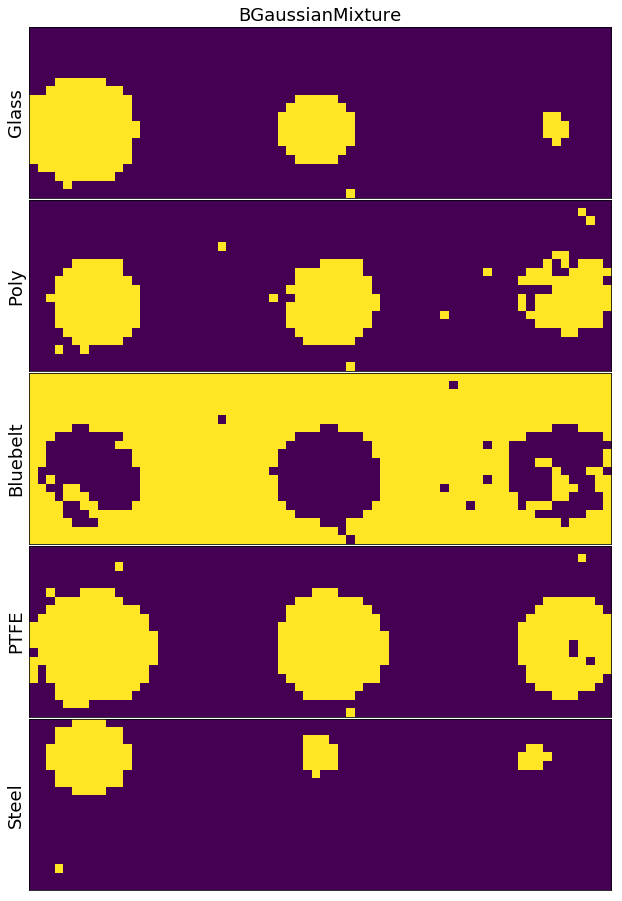

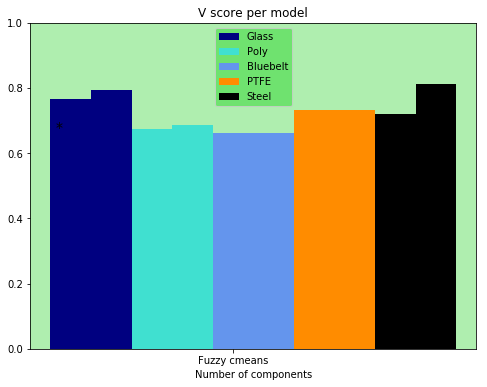

In [167]:
algo_params = {'ct':'spherical'}

vs1 = plot_results(1,1,0,cinds=[8],rng=10,algo_params=algo_params) 
vs2 = plot_results(1,1,0,cinds=[10],rng=4,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

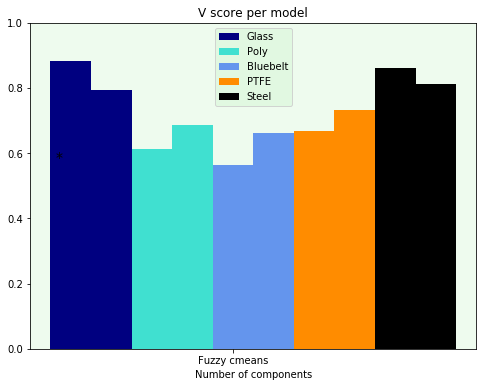

In [163]:
algo_params = {'ct':'spherical'}


vs1 = plot_results(0,0,0,cinds=[10],rng=10,mode='all',algo_params=algo_params) 
vs2 = plot_results(0,0,0,cinds=[10],rng=4,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

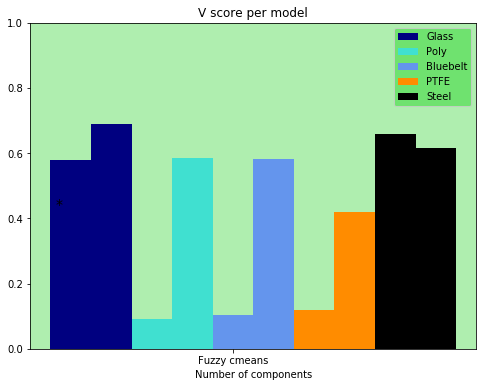

In [170]:
algo_params = {'ct':'spherical'}


vs1 = plot_results(0,0,0,cinds=[10],rng=10,w_positions=True,scale=True,algo_params=algo_params) 
vs2 = plot_results(0,0,0,cinds=[10],rng=4,mode ='all',w_positions=True,scale=True,algo_params=algo_params)
# That is something
compare_outputs(vs1,vs2)

## Birch

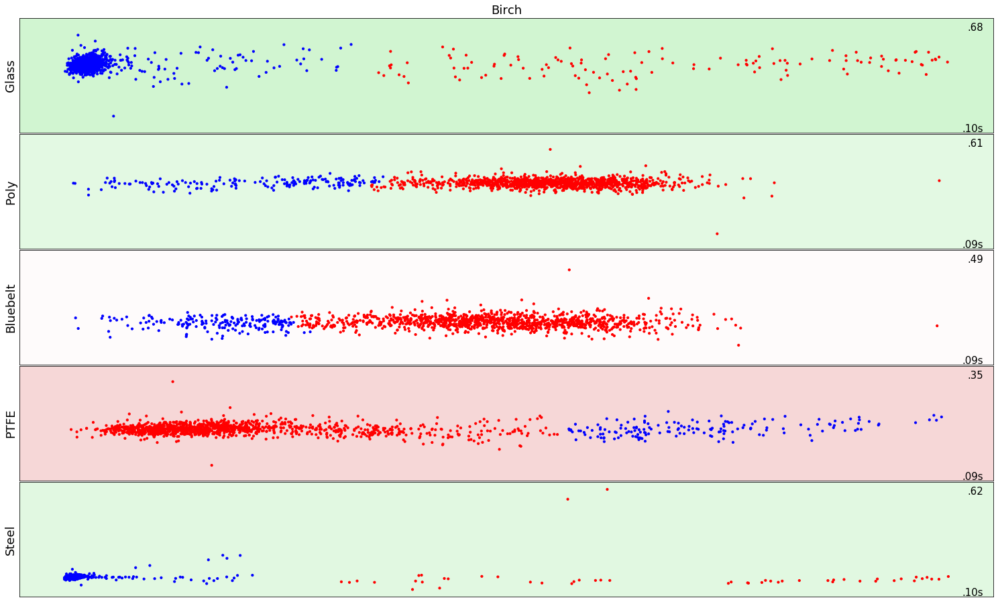

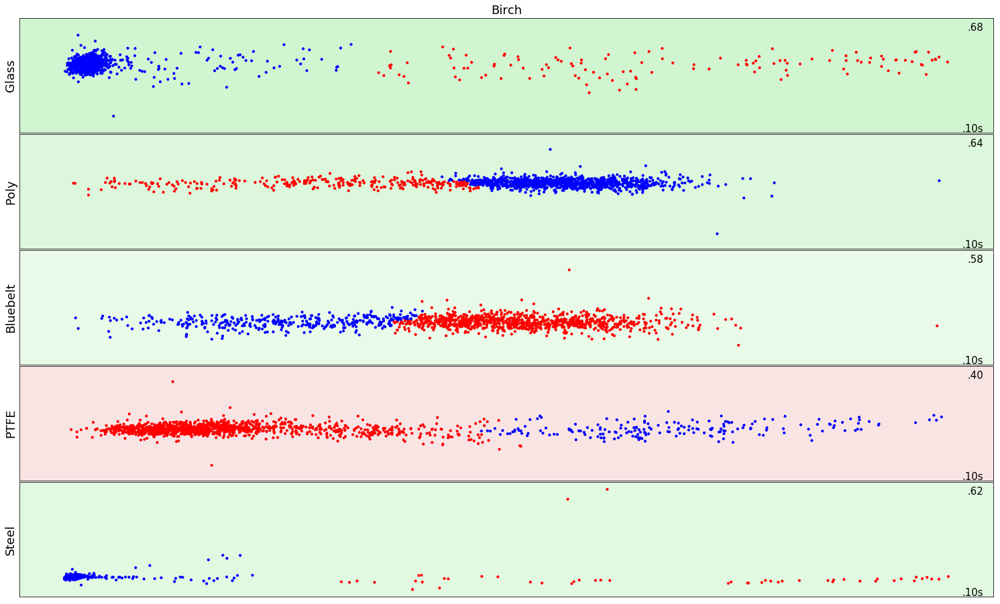

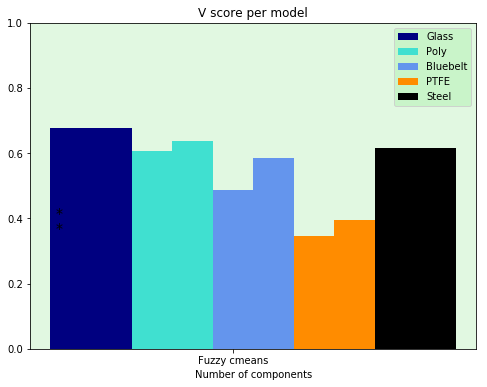

In [28]:
algo_params = {'threshold':0.0001,'branching':50}
algo_params2 = {'threshold':0.00015,'branching':19}

vs1 = plot_results(1,0,0,cinds=[7],rng=10,algo_params=algo_params) 
vs2 = plot_results(1,0,0,cinds=[7],rng=4,algo_params=algo_params2)
# That is something
compare_outputs(vs1,vs2)

## Affinity Propagation

In [ ]:
algo_params = {'threshold':0.0001,'branching':50}
algo_params2 = {'threshold':0.00015,'branching':19}

vs1 = plot_results(1,0,0,cinds=[7],rng=10,algo_params=algo_params) 
vs2 = plot_results(1,0,0,cinds=[7],rng=4,algo_params=algo_params2)
# That is something
compare_outputs(vs1,vs2)

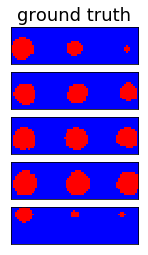

In [181]:
dataset = ['glass','pp','bb','ptfe','steel']
name = 'ground truth'
for ii in range(5):
    plt.figure(1)
    plt.subplot(5,1,ii+1)
    y_pred = loadmat('2'+dataset[ii]+'_mask')['BW'].squeeze()
    r = np.reshape(y_pred, (20,68), order="F")
    if ii == 0:
        plt.title(name, size=18)
    plt.imshow(r)
    plt.set_cmap('bwr')
    plt.xticks([])
    plt.yticks([])
    
plt.savefig('gt.png')

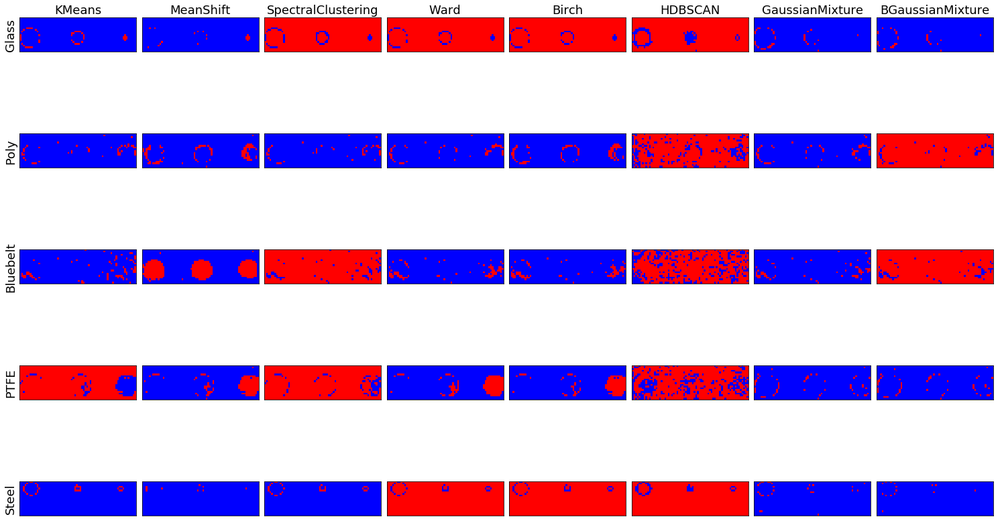

In [209]:
plot_results(srs=1,sv=0)

In [13]:
Z = loadmat('allglass.mat')['Z'][:,1:]

V0 = np.cov(Z.T)
V1 = np.linalg.inv(V0)

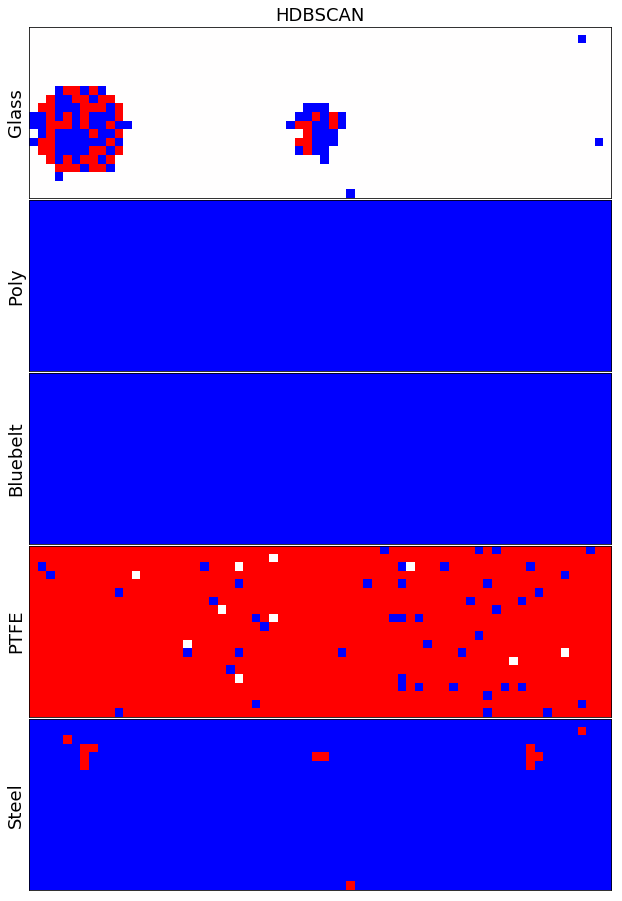

In [15]:
V0 = np.cov(Z.T)

kwargs = {'V':V0}
{'metric':'mahalanobis',
'mi_points':2}


plot_results(srs=0,sr=1,sv=0,cinds=[8],scale=True,mode='all',algo_params={'metric':'mahalanobis'},**kwargs)

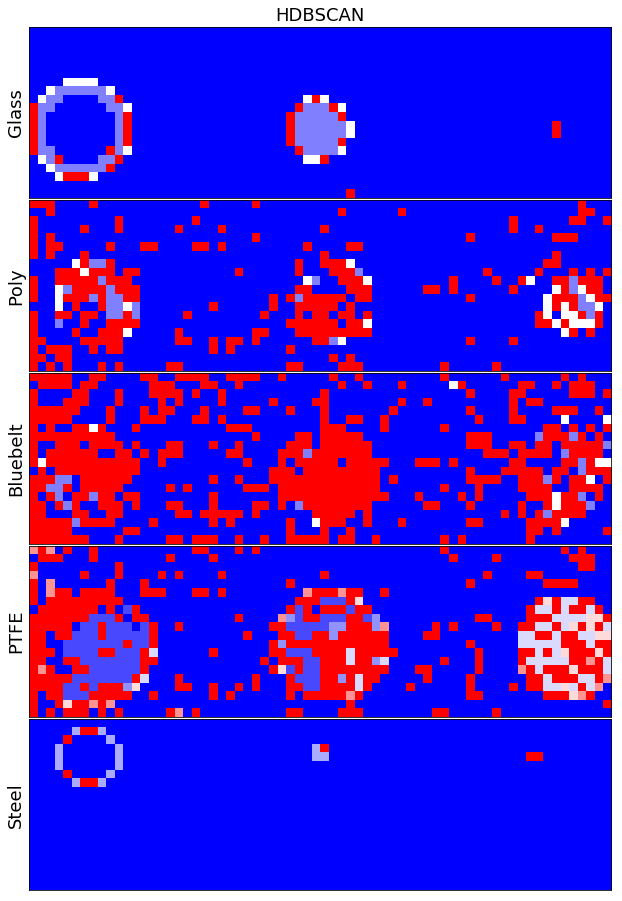

In [69]:
V0 = np.cov(Z.T)
V1 = np.linalg.inv(V0)

kwargs = {'VI': V1}
{'metric': 'mahalanobis', 'mcs': 10, 'min_sample': 5}

plot_results(srs=0, sr=1, sc=0, sv=0, cinds=[8])#, algo_params={
            # 'metric': 'mahalanobis'}, **kwargs)

In [65]:
**kwargs

SyntaxError: invalid syntax (<ipython-input-65-95eabc8c742d>, line 1)

HDBSCAN with the mahalobis distance?

In [25]:
shogun.A

TypeError: hdbscan() missing 1 required positional argument: 'X'

In [18]:
import shogun

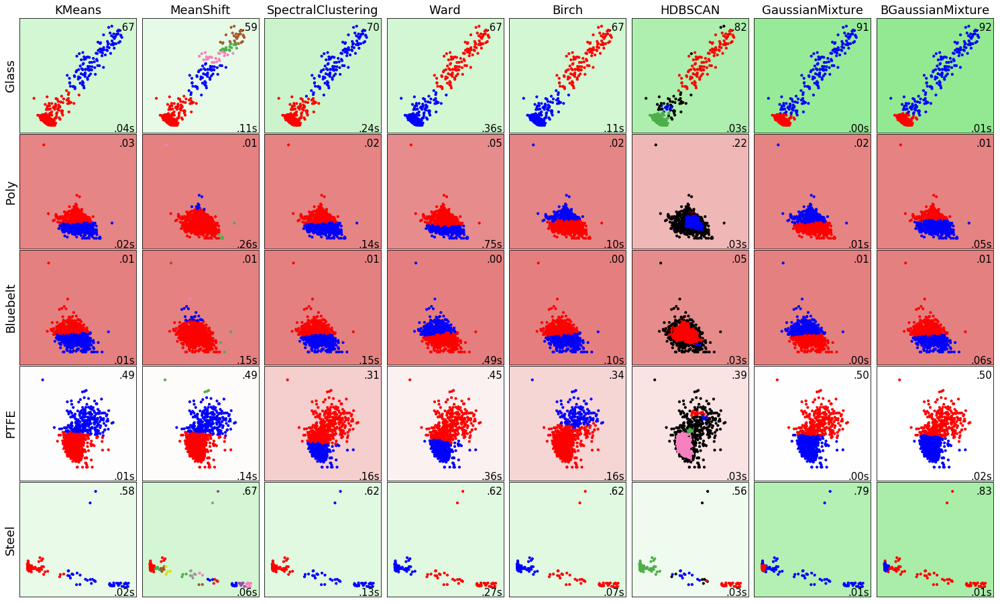

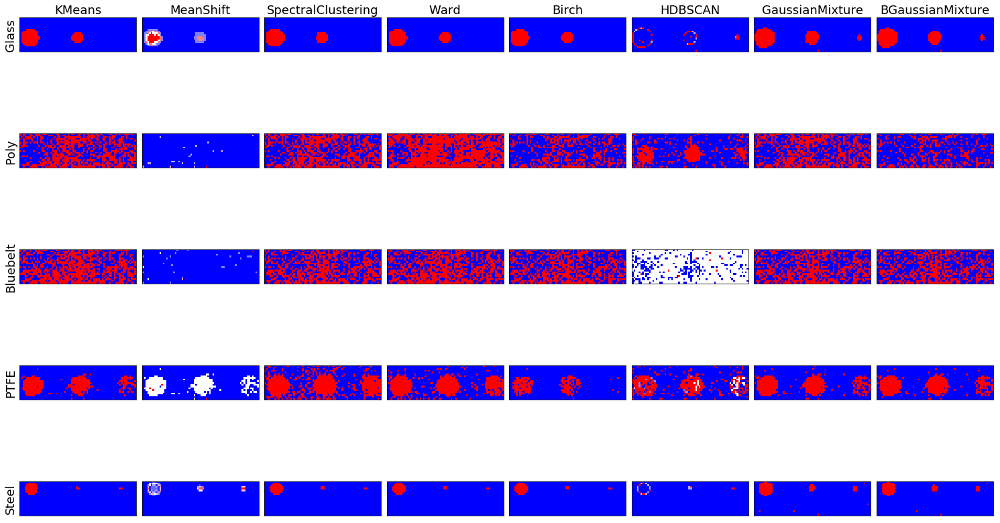

In [13]:
vs1 = plot_results(1,1,0,mode='all',red='nmf')

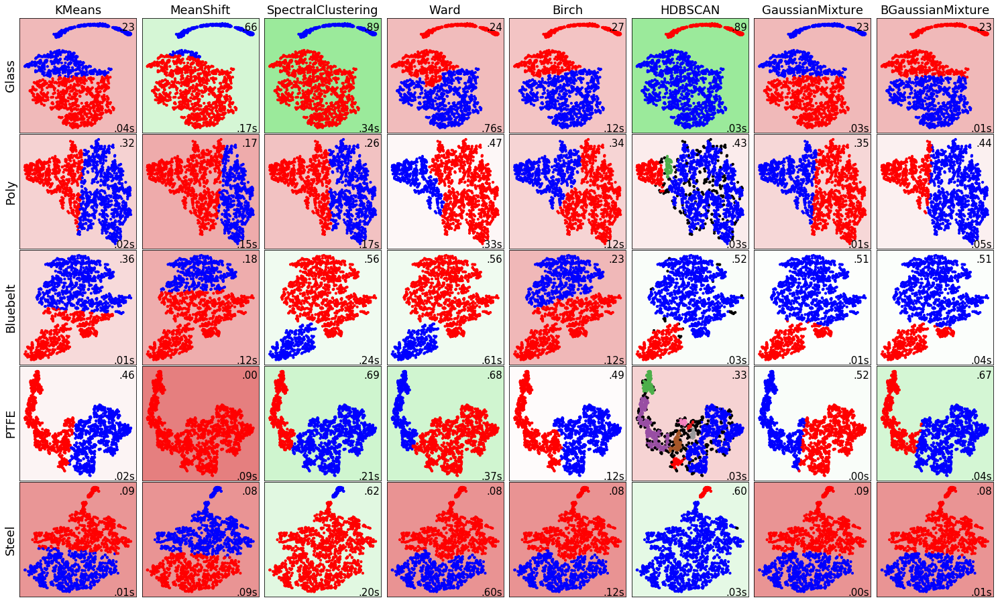

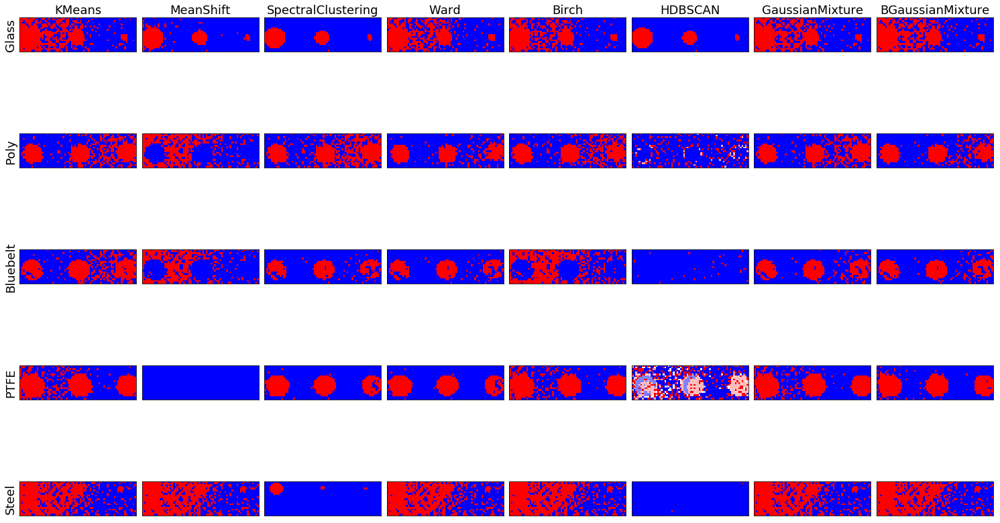

In [10]:
vs1 = plot_results(1,1,0,mode='all',red='tsne')

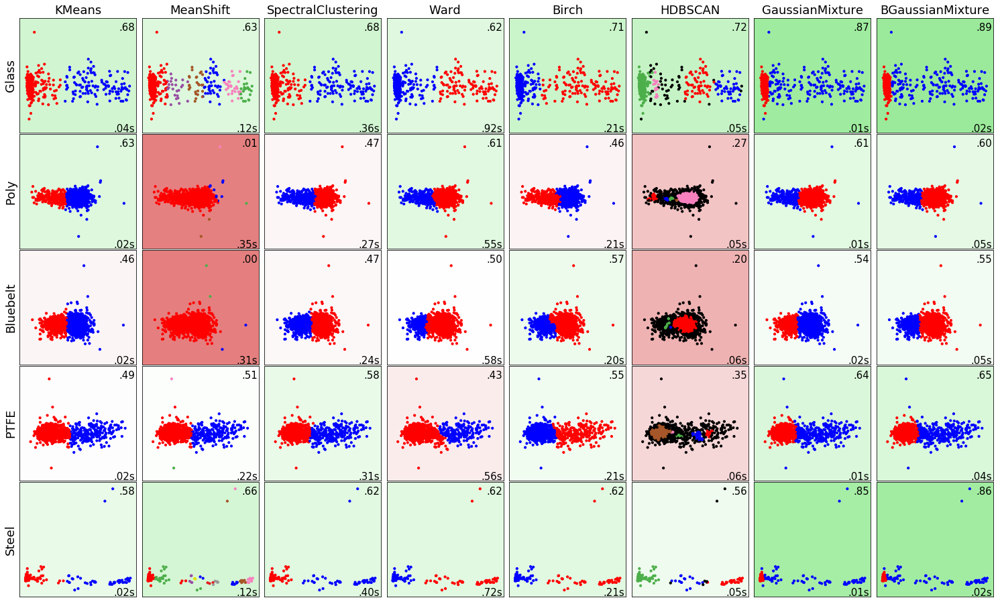

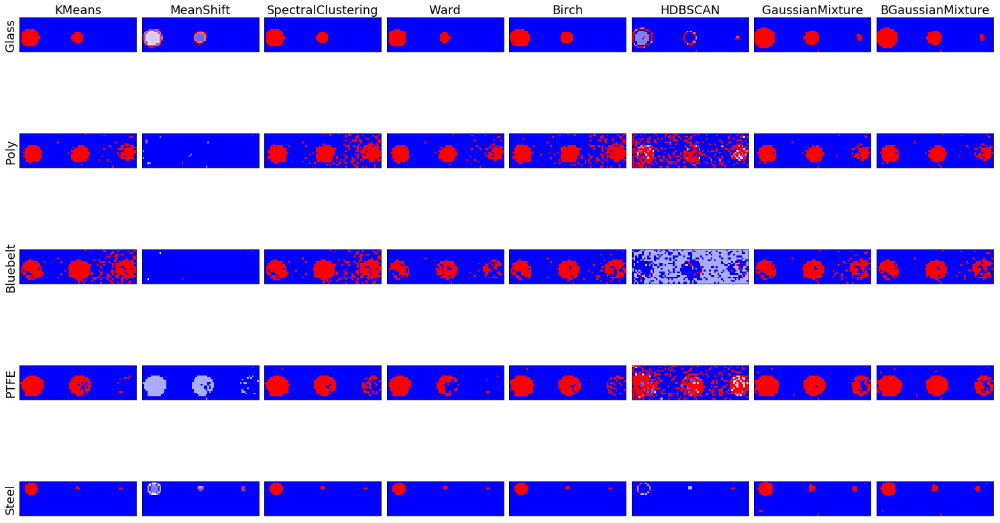

In [16]:
vs1 = plot_results(1,1,0,mode='all',red='pca')

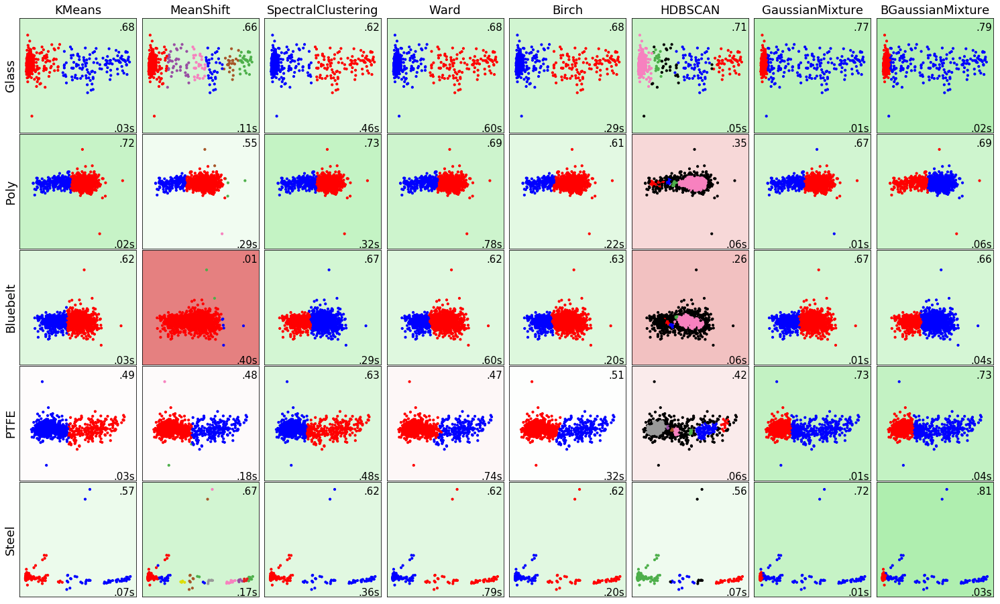

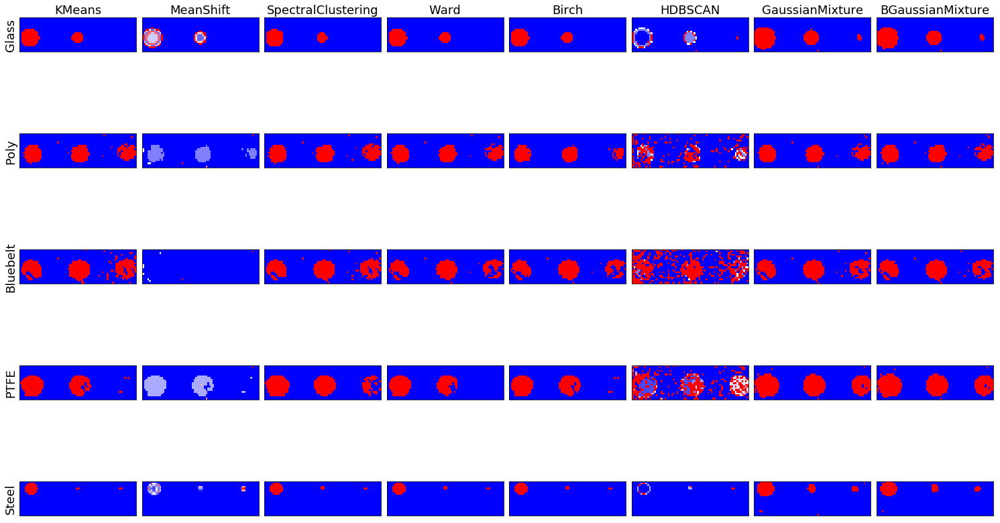

In [15]:
vs1 = plot_results(1,1,0)

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


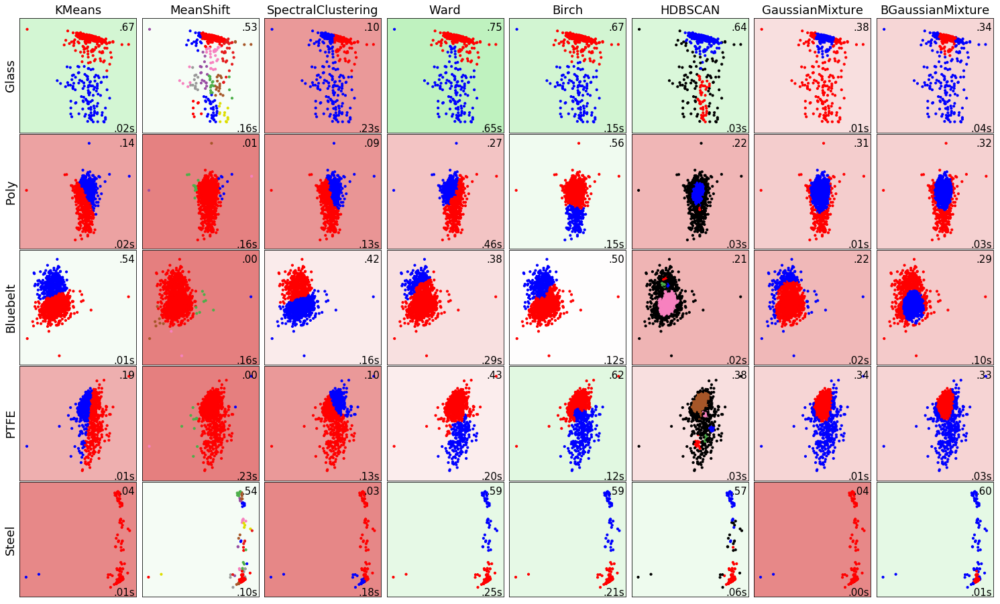

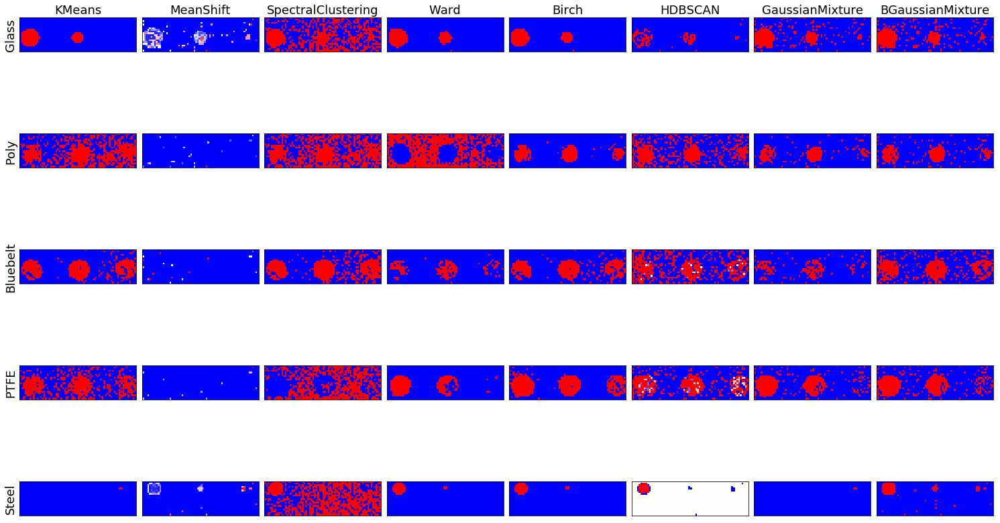

In [2]:
vs1 = plot_results(1,1,0,mode='all',red='ica')

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


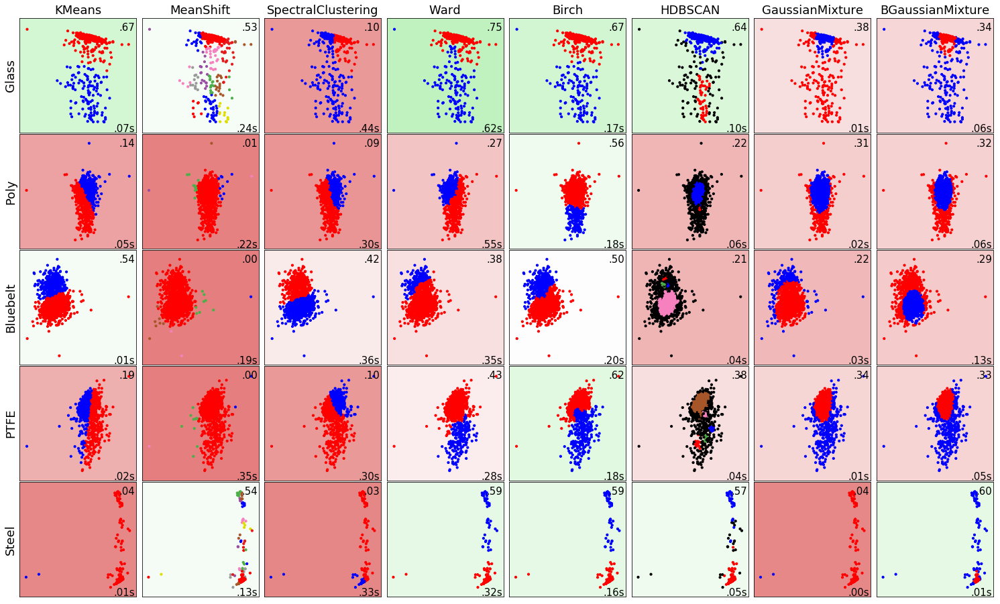

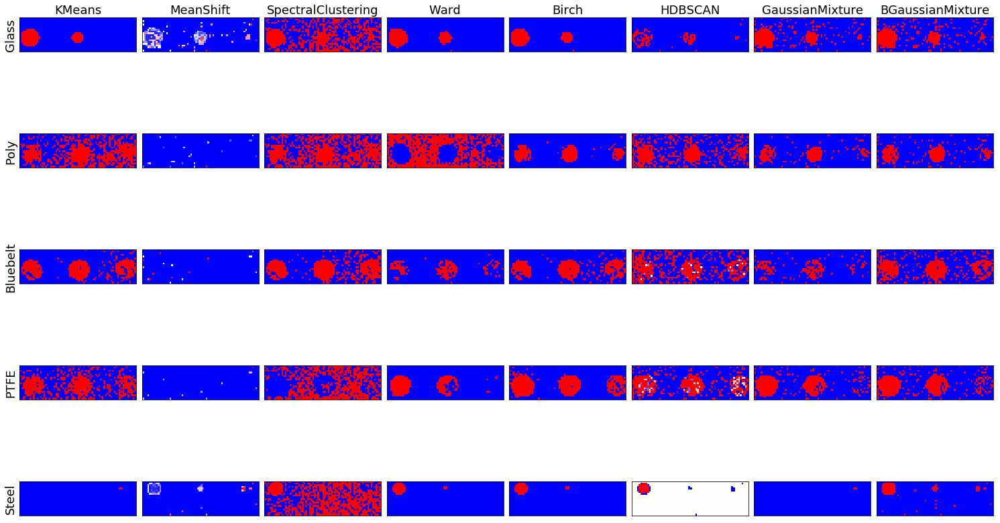

In [11]:
vs1 = plot_results(1,1,0,mode='all',red='ica')

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


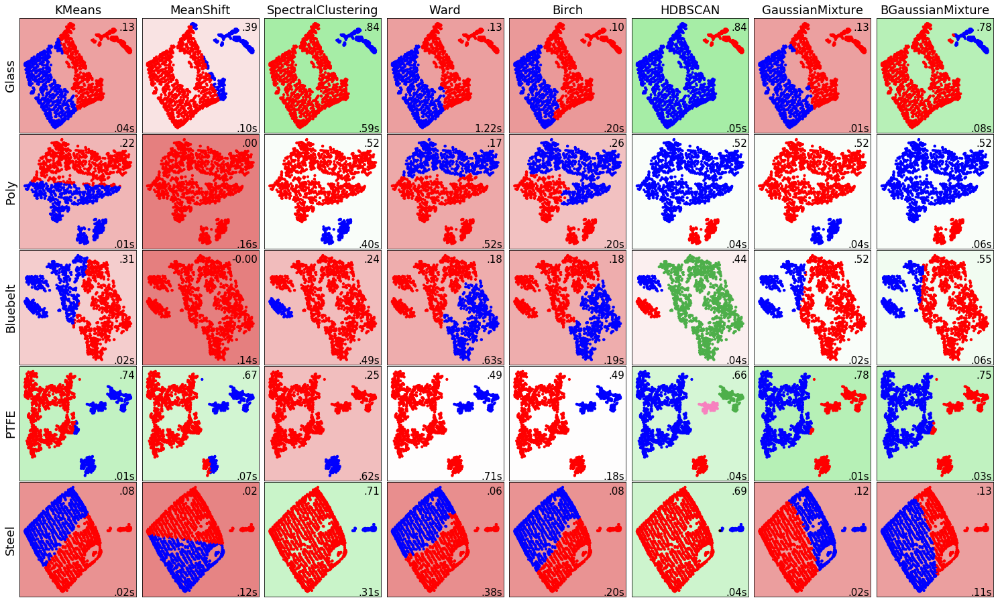

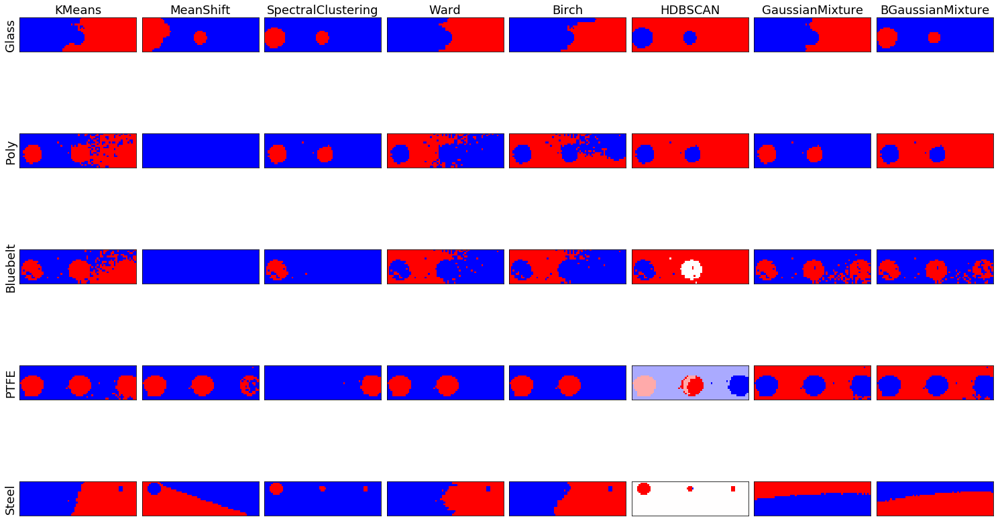

In [6]:
vs1 = plot_results(1,1,0,mode='all',w_positions=True,scale=True,red='tsne')#,cinds=[9,10])

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:243: UserWarning: the number of connected components of the connectivity matrix is 113 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


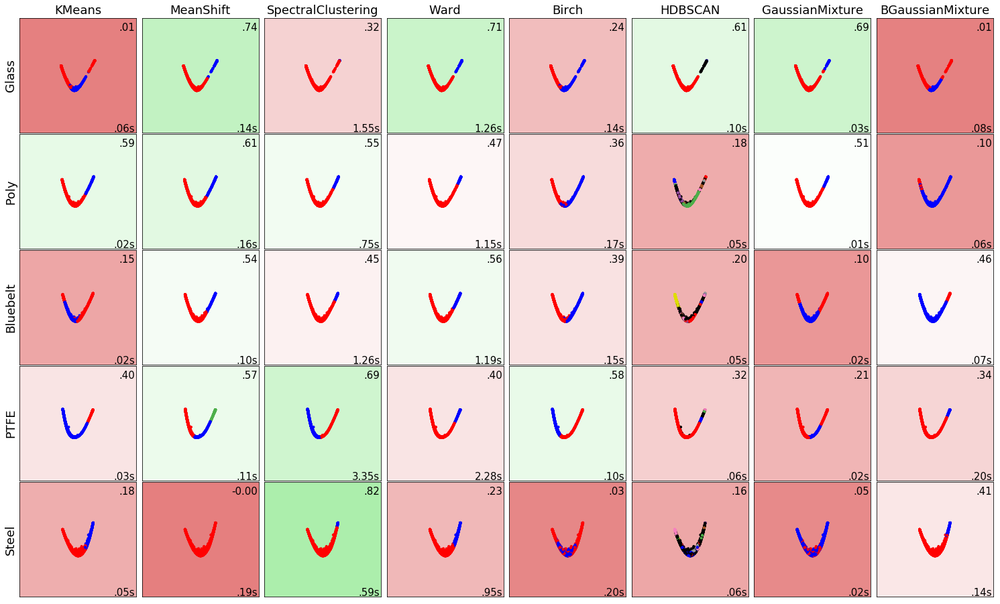

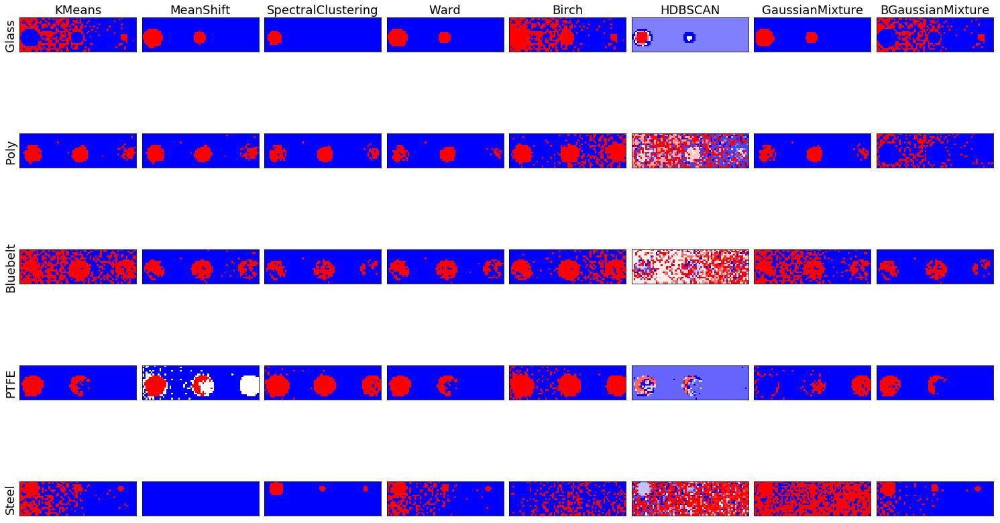

In [4]:
vs1 = plot_results(1,1,0,mode='all',red='spec')

In [34]:
Z = loadmat('allglass.mat')['Z'][:,1:]


# Convert to features for shogun
mixed_signals = shogun.RealFeatures((Z.T).astype(np.float64))

from shogun import Jade

# Separating with JADE
jade = Jade()
signals = jade.apply(mixed_signals)

S_ = signals.get_feature_matrix()

A_ = jade.get_mixing_matrix()
A_ = A_ / A_.sum(axis=0)

print('Estimated Mixing Matrix:')
print(A_)

Estimated Mixing Matrix:
[[ 2.51073926e-01  1.75133813e-02  4.10153114e-01  7.32788567e-01
   2.53778995e-01]
 [ 2.25628450e-01  1.30965286e-01  4.51296571e-01 -1.49249755e-02
   2.12678556e-01]
 [ 1.36229672e-01  1.90035335e-01  3.18687719e-01 -1.06375765e+00
   1.38253180e-01]
 [ 2.87130881e-01  8.10532128e-04 -5.05512035e-01  9.98673565e-01
   2.82678990e-01]
 [ 9.99370716e-02  6.60675465e-01  3.25374631e-01  3.47220490e-01
   1.12610279e-01]]


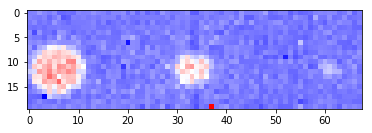

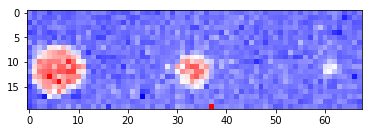

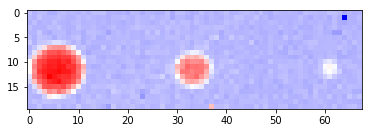

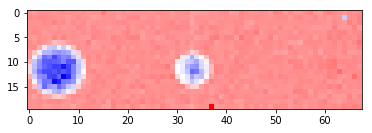

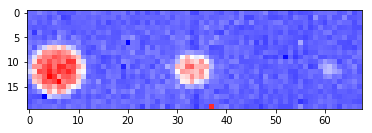

In [35]:
# Show separation results
# Separated Signal i
for i in range(S_.shape[0]):
    plt.figure()
    r = np.reshape(S_[i], (20,68), order="F")
    plt.imshow(r)
    
plt.show()

In [6]:
# Show separation results
# Separated Signal i
for i in range(S_.shape[0]):
    plt.figure()
    r = np.reshape(S_[i], (20,68), order="F")
    plt.imshow(r)
    
plt.show()

In [23]:
!pip list | grep shogun

DEPRECATION: The default format will switch to columns in the future. You can use --format=(legacy|columns) (or define a format=(legacy|columns) in your pip.conf under the [list] section) to disable this warning.
You are using pip version 9.0.1, however version 19.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


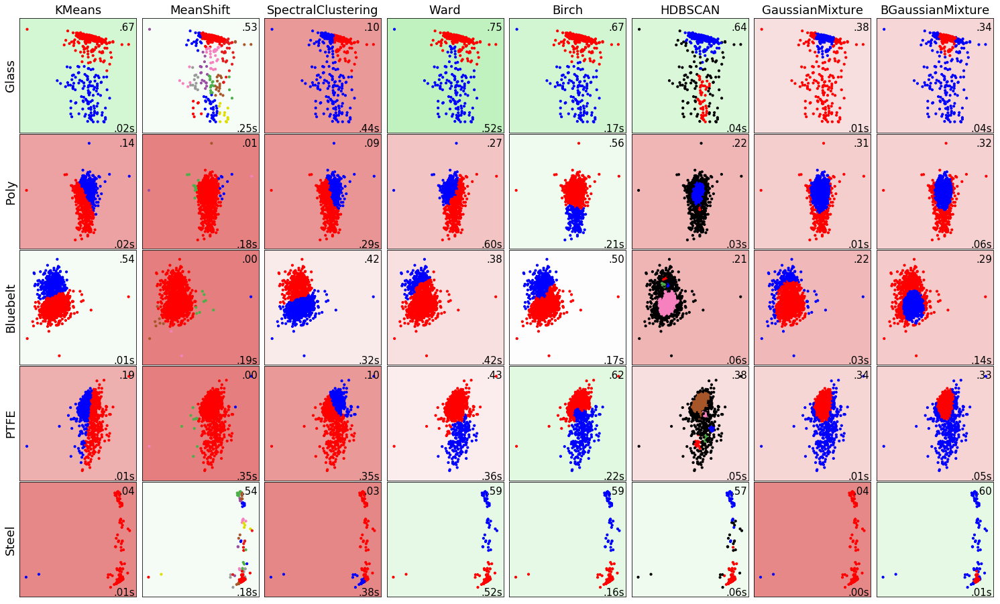

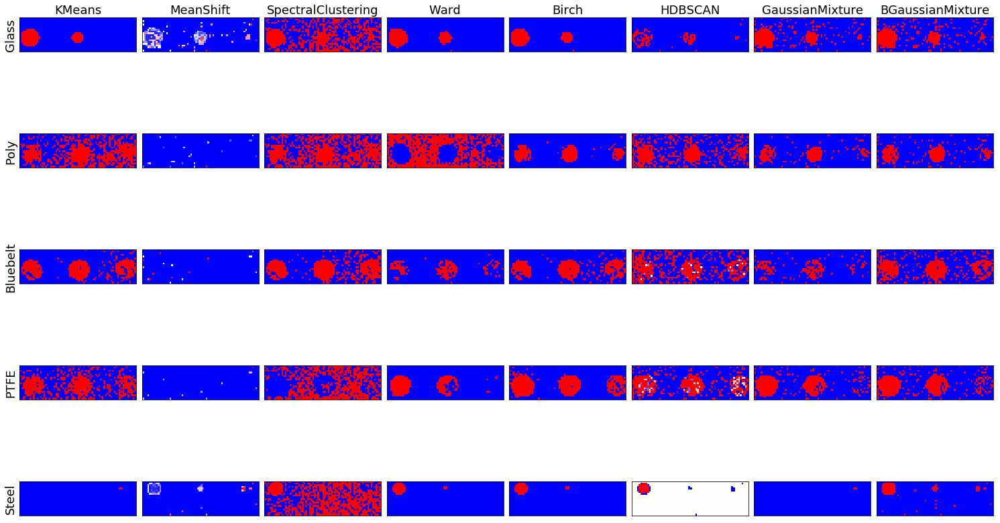

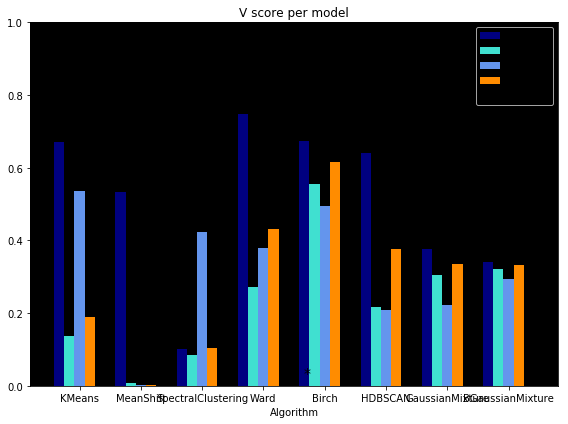

In [5]:
vs1 = plot_results(1,1,1,mode='all',red='ica')

## Comparison over Decomposition Methods

/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/sklearn/mixture/base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


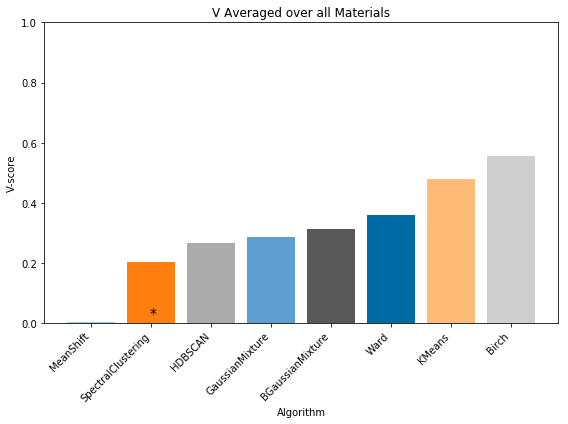

In [8]:
bars_ica = plot_results(0,0,0,1,mode='all',red='ica',return_vs=0,return_bars=1,dinds=[1,2,3])

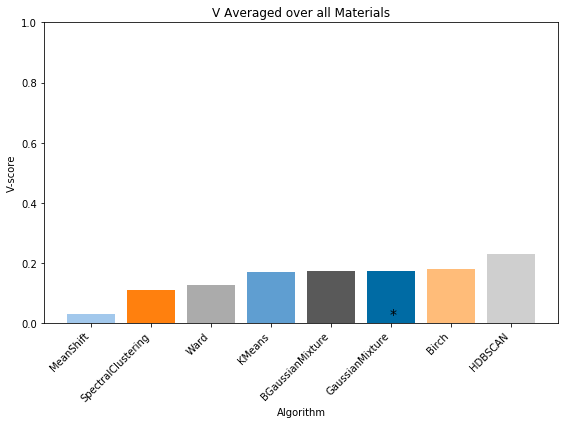

In [9]:
bars_nmf = plot_results(0,0,0,1,mode='all',red='nmf',return_vs=0,return_bars=1,dinds=[1,2,3])

Populating the interactive namespace from numpy and matplotlib
Automatically created module for IPython interactive environment


/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['title']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/home/jerichooconnell/anaconda3/lib/python3.5/site-packages/matplotlib/cbook/__init__

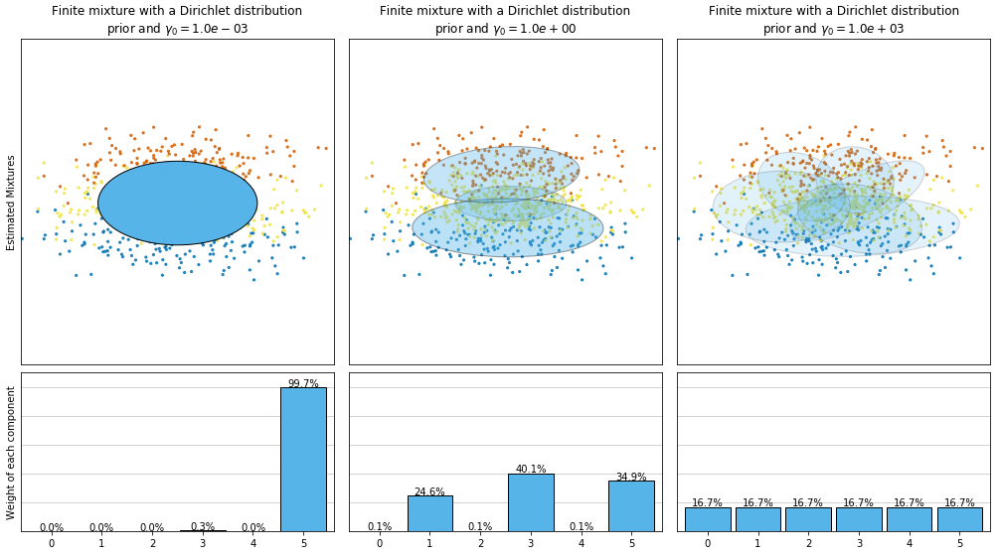

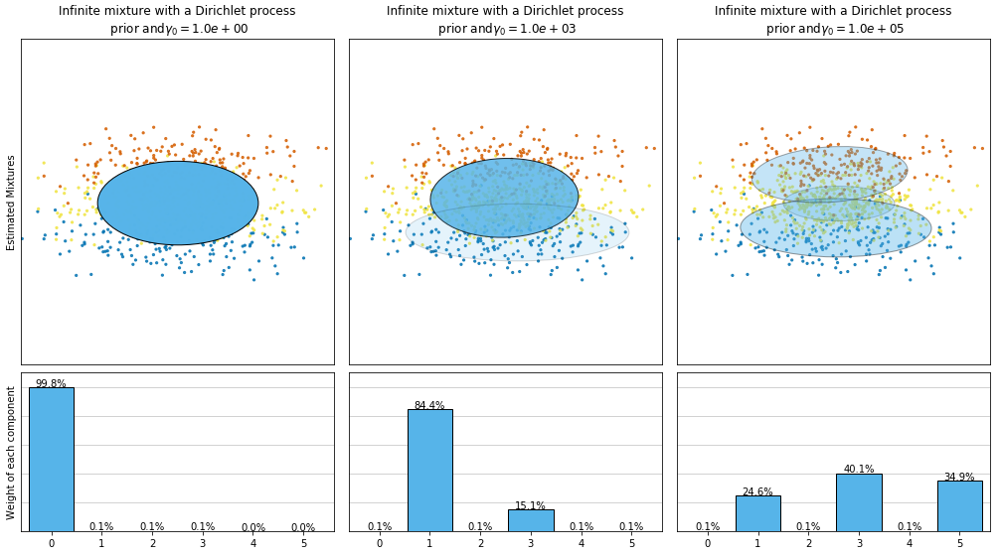

In [2]:
# Author: Thierry Guillemot <thierry.guillemot.work@gmail.com>
# License: BSD 3 clause
%pylab inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sklearn.mixture import BayesianGaussianMixture

print(__doc__)


def plot_ellipses(ax, weights, means, covars):
    for n in range(means.shape[0]):
        eig_vals, eig_vecs = np.linalg.eigh(covars[n])
        unit_eig_vec = eig_vecs[0] / np.linalg.norm(eig_vecs[0])
        angle = np.arctan2(unit_eig_vec[1], unit_eig_vec[0])
        # Ellipse needs degrees
        angle = 180 * angle / np.pi
        # eigenvector normalization
        eig_vals = 2 * np.sqrt(2) * np.sqrt(eig_vals)
        ell = mpl.patches.Ellipse(means[n], eig_vals[0], eig_vals[1],
                                  180 + angle, edgecolor='black')
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(weights[n])
        ell.set_facecolor('#56B4E9')
        ax.add_artist(ell)


def plot_results(ax1, ax2, estimator, X, y, title, plot_title=False):
    ax1.set_title(title)
    ax1.scatter(X[:, 0], X[:, 1], s=5, marker='o', color=colors[y], alpha=0.8)
    ax1.set_xlim(-2., 2.)
    ax1.set_ylim(-3., 3.)
    ax1.set_xticks(())
    ax1.set_yticks(())
    plot_ellipses(ax1, estimator.weights_, estimator.means_,
                  estimator.covariances_)

    ax2.get_xaxis().set_tick_params(direction='out')
    ax2.yaxis.grid(True, alpha=0.7)
    for k, w in enumerate(estimator.weights_):
        ax2.bar(k, w, width=0.9, color='#56B4E9', zorder=3,
                align='center', edgecolor='black')
        ax2.text(k, w + 0.007, "%.1f%%" % (w * 100.),
                 horizontalalignment='center')
    ax2.set_xlim(-.6, 2 * n_components - .4)
    ax2.set_ylim(0., 1.1)
    ax2.tick_params(axis='y', which='both', left='off',
                    right='off', labelleft='off')
    ax2.tick_params(axis='x', which='both', top='off')

    if plot_title:
        ax1.set_ylabel('Estimated Mixtures')
        ax2.set_ylabel('Weight of each component')

# Parameters of the dataset
random_state, n_components, n_features = 2, 3, 2
colors = np.array(['#0072B2', '#F0E442', '#D55E00'])

covars = np.array([[[.7, .0], [.0, .1]],
                   [[.5, .0], [.0, .1]],
                   [[.5, .0], [.0, .1]]])
samples = np.array([200, 500, 200])
means = np.array([[.0, -.70],
                  [.0, .0],
                  [.0, .70]])

# mean_precision_prior= 0.8 to minimize the influence of the prior
estimators = [
    ("Finite mixture with a Dirichlet distribution\nprior and "
     r"$\gamma_0=$", BayesianGaussianMixture(
        weight_concentration_prior_type="dirichlet_distribution",
        n_components=2 * n_components, reg_covar=0, init_params='random',
        max_iter=1500, mean_precision_prior=.8,
        random_state=random_state), [0.001, 1, 1000]),
    ("Infinite mixture with a Dirichlet process\n prior and" r"$\gamma_0=$",
     BayesianGaussianMixture(
        weight_concentration_prior_type="dirichlet_process",
        n_components=2 * n_components, reg_covar=0, init_params='random',
        max_iter=1500, mean_precision_prior=.8,
        random_state=random_state), [1, 1000, 100000])]

# Generate data
rng = np.random.RandomState(random_state)
X = np.vstack([
    rng.multivariate_normal(means[j], covars[j], samples[j])
    for j in range(n_components)])
y = np.concatenate([np.full(samples[j], j, dtype=int)
                    for j in range(n_components)])

# Plot results in two different figures
for (title, estimator, concentrations_prior) in estimators:
    plt.figure(figsize=(4.7 * 3, 8))
    plt.subplots_adjust(bottom=.04, top=0.90, hspace=.05, wspace=.05,
                        left=.03, right=.99)

    gs = gridspec.GridSpec(3, len(concentrations_prior))
    for k, concentration in enumerate(concentrations_prior):
        estimator.weight_concentration_prior = concentration
        estimator.fit(X)
        plot_results(plt.subplot(gs[0:2, k]), plt.subplot(gs[2, k]), estimator,
                     X, y, r"%s$%.1e$" % (title, concentration),
                     plot_title=k == 0)

plt.show()

| Method name                                                                              | Parameters                                              | Scalability                                      | Usecase                                                                   | Geometry (metric used)                       |
| ---------------------------------------------------------------------------------------- | ------------------------------------------------------- | ------------------------------------------------ | ------------------------------------------------------------------------- | -------------------------------------------- |
| <span class="title-ref">K-Means \<k\_means\></span>                                      | number of clusters                                      | Very large `n_samples`, medium `n_clusters` with | General-purpose, even cluster size, flat geometry, not too many clusters  | Distances between points                     |
| <span class="title-ref">Affinity propagation \<affinity\_propagation\></span>            | damping, sample preference                              | Not scalable with n\_samples                     | Many clusters, uneven cluster size, non-flat geometry                     | Graph distance (e.g. nearest-neighbor graph) |
| <span class="title-ref">Mean-shift \<mean\_shift\></span>                                | bandwidth                                               | Not scalable with `n_samples`                    | Many clusters, uneven cluster size, non-flat geometry                     | Distances between points                     |
| <span class="title-ref">Spectral clustering \<spectral\_clustering\></span>              | number of clusters                                      | Medium `n_samples`, small `n_clusters`           | Few clusters, even cluster size, non-flat geometry                        | Graph distance (e.g. nearest-neighbor graph) |
| <span class="title-ref">Ward hierarchical clustering \<hierarchical\_clustering\></span> | number of clusters                                      | Large `n_samples` and `n_clusters`               | Many clusters, possibly connectivity constraints                          | Distances between points                     |
| <span class="title-ref">Agglomerative clustering \<hierarchical\_clustering\></span>     | number of clusters, linkage type, distance              | Large `n_samples` and `n_clusters`               | Many clusters, possibly connectivity constraints, non Euclidean distances | Any pairwise distance                        |
| <span class="title-ref">hDBSCAN \<dbscan\></span>                                         | neighborhood size                                       | Very large `n_samples`, medium `n_clusters`      | Non-flat geometry, uneven cluster sizes                                   | Distances between nearest points             |
| <span class="title-ref">Gaussian mixtures \<mixture\></span>                             | many                                                    | Not scalable                                     | Flat geometry, good for density estimation                                | Mahalanobis distances to centers             |
| <span class="title-ref">Birch</span>                                                     | branching factor, threshold, optional global clusterer. | Large `n_clusters` and `n_samples`               | Large dataset, outlier removal, data reduction.                           | Euclidean distance between points            |
pandoc 2.6

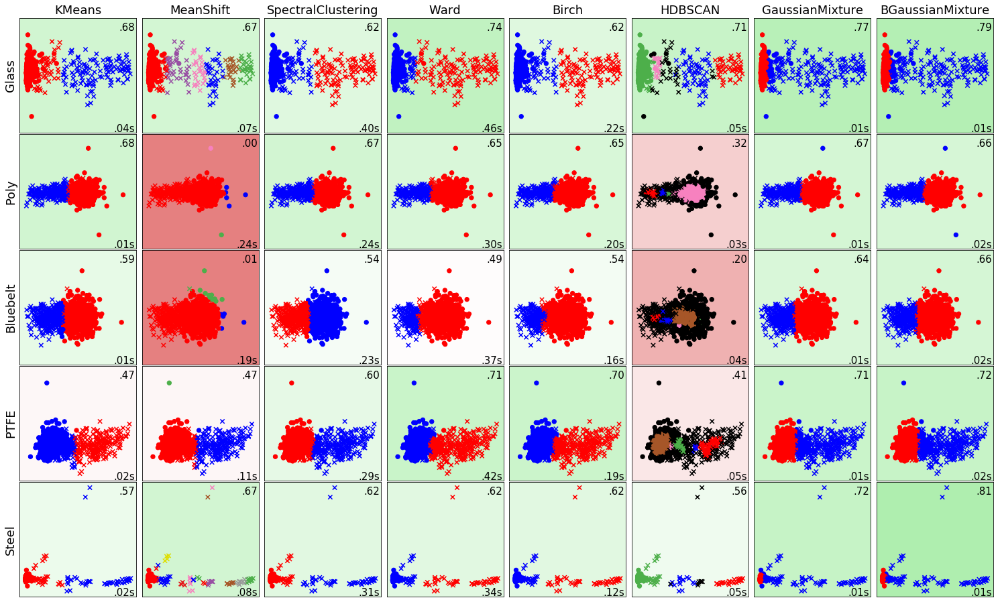

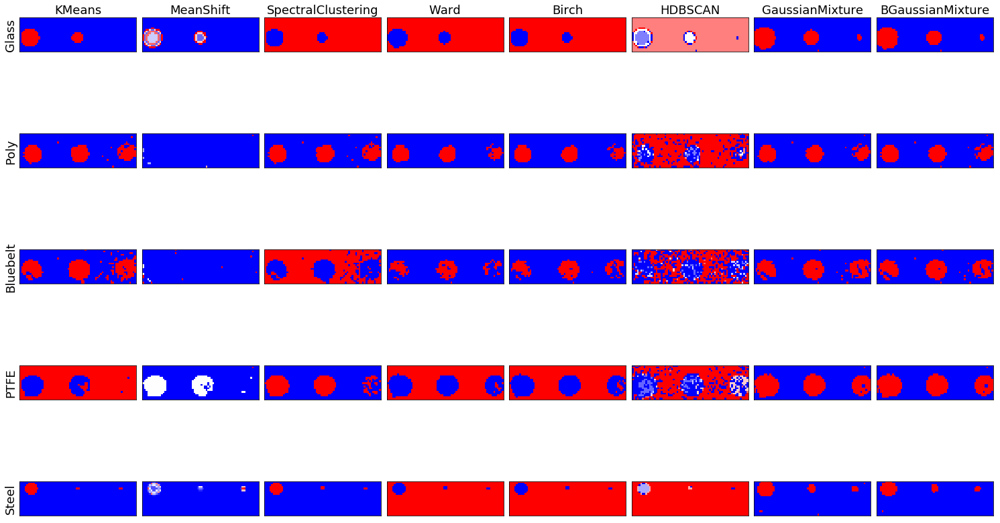

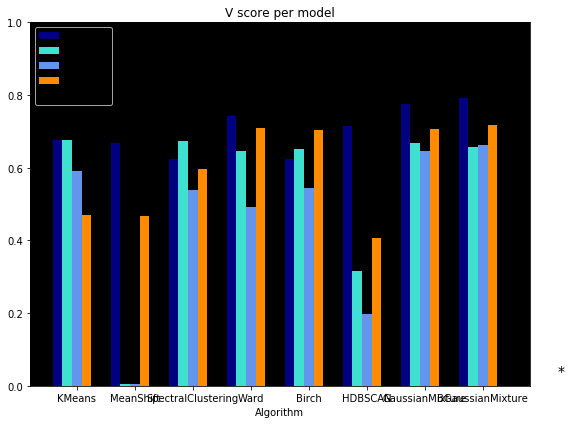

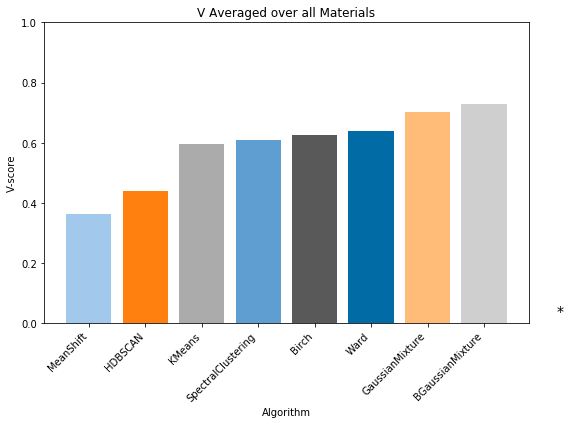

In [2]:
b_small = plot_results(1,1,1,1,mode='small',return_bars=True)

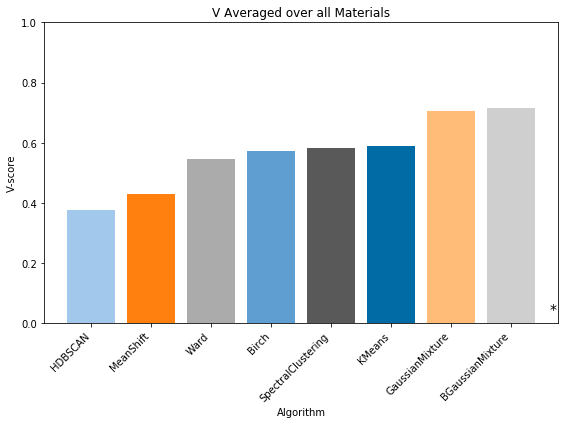

In [9]:
b_all = plot_results(0,0,0,1,mode='all',return_bars=True)

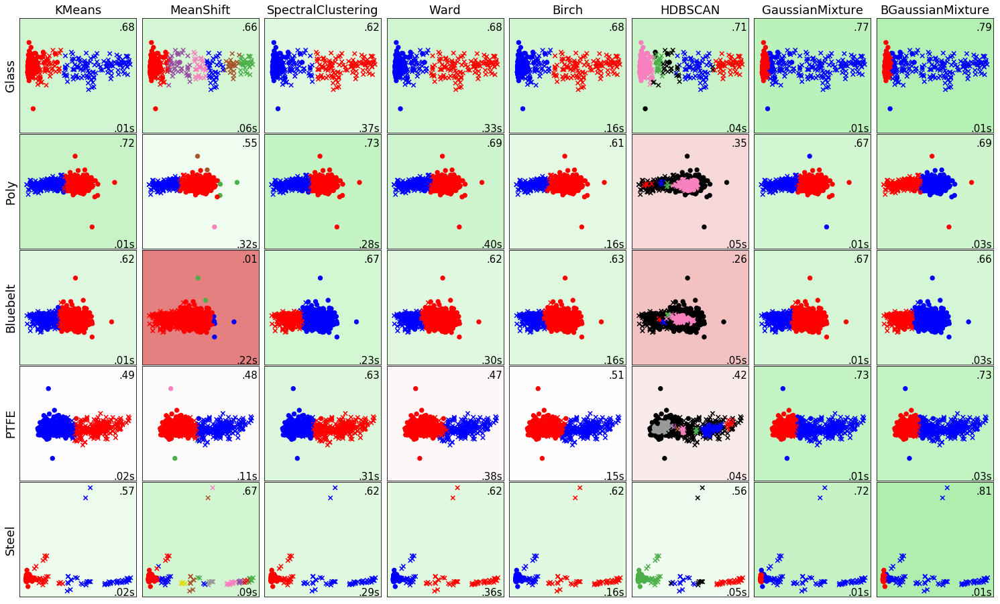

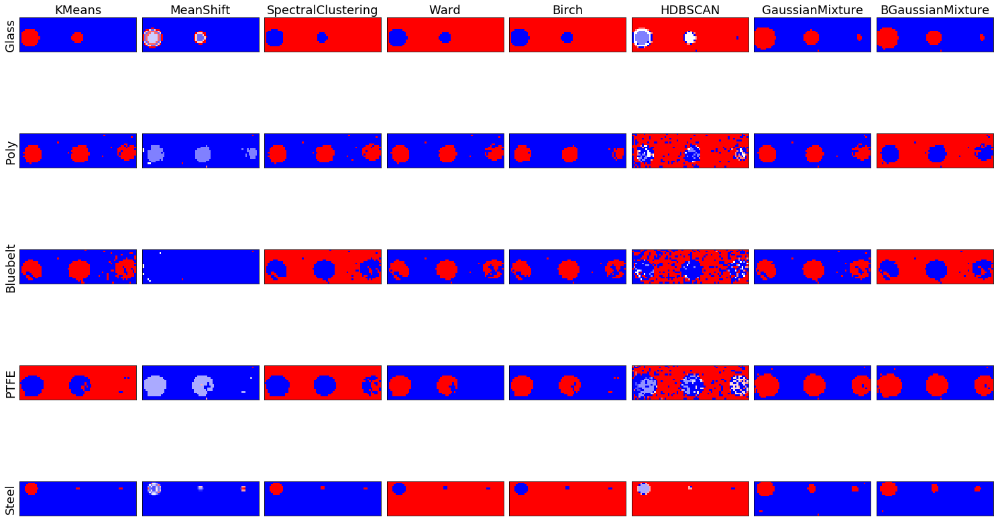

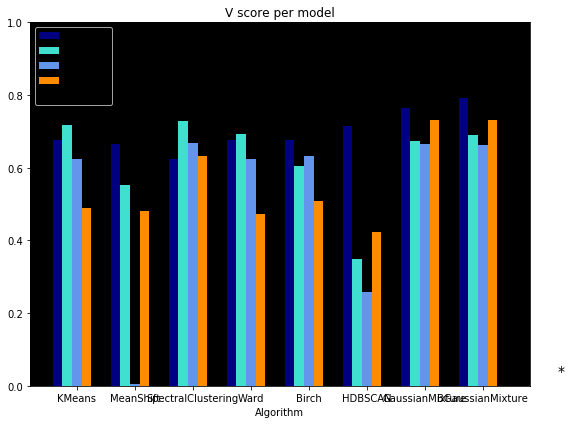

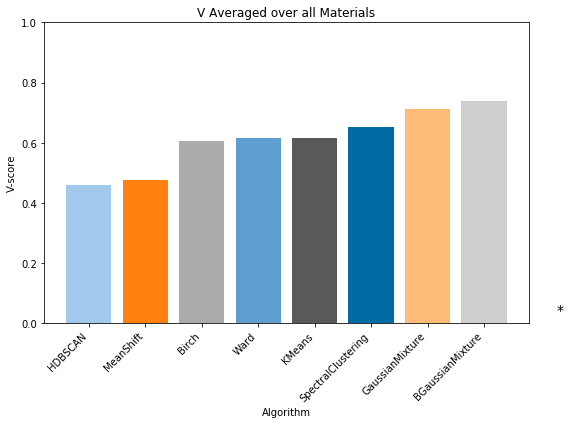

In [3]:
b_pca = plot_results(1,1,1,1,return_bars=True)

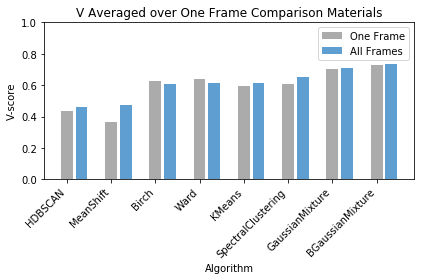

In [9]:
compare_2(b_small,b_pca,title='One Frame Comparison',leg=['One Frame','All Frames'])

TypeError: only size-1 arrays can be converted to Python scalars

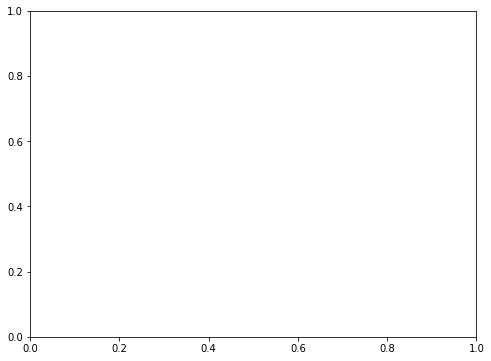

In [4]:
compare_outputs(b_small,b_pca)

bars_pc = plot_results(0,0,0,1,return_vs=0,return_bars=1,mode='all',red='nmf')

bars_ica = plot_results(0,0,0,1,return_vs=0,return_bars=1,mode='all',red='ica')

bars_pca = plot_results(0,0,0,1,return_vs=0,return_bars=1)

compare_3(bars_pc,bars_ica,bars_pca,title='Dimensional Reduction Methods',leg=['NMF','ICA','PCA'])